In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, RobustScaler, normalize
# from sklearn.model_selection import GroupKFold
# from sklearn import metrics

# import time
# import lightgbm as lgb

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)

we work with the data from ventilators connected to a sedated patient's lung. Our goal is to similate the ventilator and correctly predict the airway pressure in the respiratory circuit during the breath.

It is important to understand that this isn't a usual time-series analysis. In time-series tasks, we need to predict the future values of the series based on the previous values. Here we use the values of different series to predict the values of other series. So this is a regression task.

In [2]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

In [3]:
train_df.head()

,id,breath_id,R,C,time_step,u_in,u_out,pressure
0,1,1,20,50,0.000000,0.083334,0,5.837492
1,2,1,20,50,0.033652,18.383041,0,5.907794
2,3,1,20,50,0.067514,22.509278,0,7.876254
3,4,1,20,50,0.101542,22.808822,0,11.742872
4,5,1,20,50,0.135756,25.355850,0,12.234987


In [4]:
test_df.head()

,id,breath_id,R,C,time_step,u_in,u_out
0,1,0,5,20,0.000000,0.000000,0
1,2,0,5,20,0.031904,7.515046,0
2,3,0,5,20,0.063827,14.651675,0
3,4,0,5,20,0.095751,21.230610,0
4,5,0,5,20,0.127644,26.320956,0


## EDA

In [5]:
train_df.shape

(6036000, 8)

In [6]:
train_df.nunique().to_frame()

,0
id,6036000
breath_id,75450
R,3
C,3
time_step,3767571
u_in,4020300
u_out,2
pressure,950


In [72]:
test_df.nunique().to_frame()

,0
id,4024000
breath_id,50300
R,3
C,3
time_step,2855528
u_in,2787822
u_out,2


https://www.kaggle.com/artgor/ventilator-pressure-prediction-eda-fe-and-models

The dataset is quite large - more than 6 mln rows. There are 2 categorical features (R and C), the id of a row, the id of a breath, timestamp and continuous variables.

In [64]:
print(set(test_df['breath_id'].unique()).intersection(set(train_df['breath_id'].unique())))
print(set(train_df['breath_id'].unique()).intersection(set(test_df['breath_id'].unique())))

set()
set()


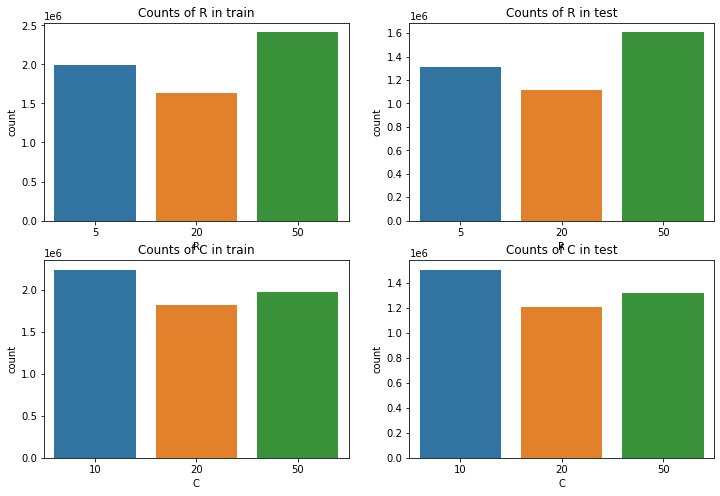

In [65]:
fig, ax = plt.subplots(figsize = (12, 8))
plt.subplot(2, 2, 1)
sns.countplot(x='R', data=train_df)
plt.title('Counts of R in train');
plt.subplot(2, 2, 2)
sns.countplot(x='R', data=test_df)
plt.title('Counts of R in test');
plt.subplot(2, 2, 3)
sns.countplot(x='C', data=train_df)
plt.title('Counts of C in train');
plt.subplot(2, 2, 4)
sns.countplot(x='C', data=test_df)
plt.title('Counts of C in test');

R and C categorical variables have a similar distribution in train and test data.

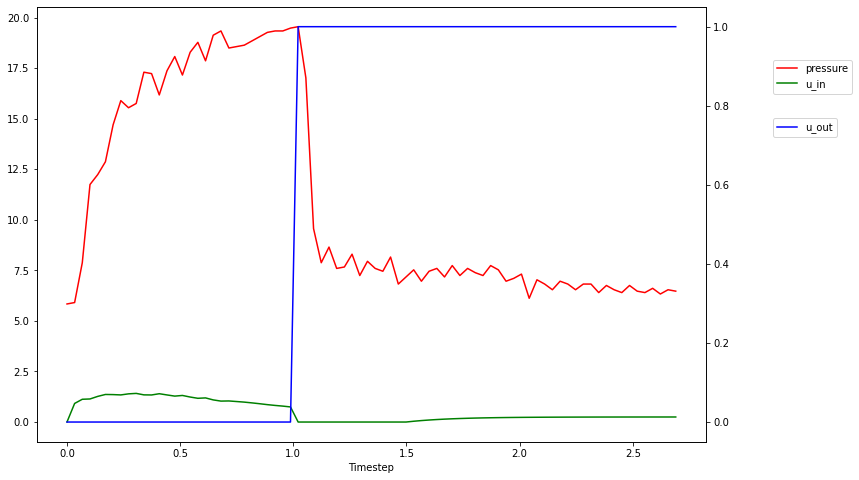

In [66]:
fig, ax1 = plt.subplots(figsize = (12, 8))

breath_1 = train_df.loc[train_df['breath_id'] == 1]
ax2 = ax1.twinx()

ax1.plot(breath_1['time_step'], breath_1['pressure'], 'r-', label='pressure')
ax1.plot(breath_1['time_step'], breath_1['u_in'], 'g-', label='u_in')
ax2.plot(breath_1['time_step'], breath_1['u_out'], 'b-', label='u_out')

ax1.set_xlabel('Timestep')

ax1.legend(loc=(1.1, 0.8))
ax2.legend(loc=(1.1, 0.7))
plt.show()

This is quite interesting: we can see that at first the pressure (our target) is rising and then, after the u_out becomes equal to 1, it has an abrupt drop. I think it would be useful to create new features based on the behavior of these features.

https://www.kaggle.com/qquick/ventilator-eda-visual-correlation-w-pressure

In [40]:
train_df['RC'] = [f'{r}_{c}' for r, c in zip(train_df['R'], train_df['C'])]

<AxesSubplot:xlabel='RC', ylabel='count'>

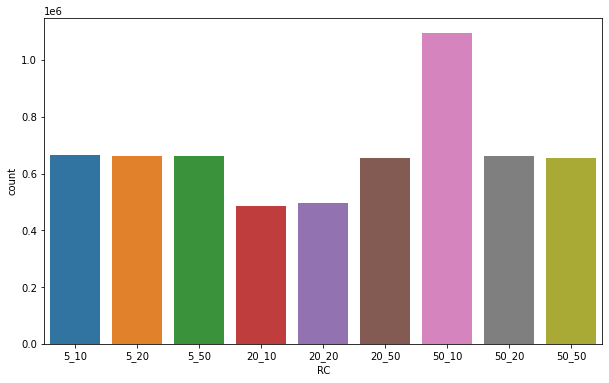

In [41]:
RC_order = ['5_10', '5_20', '5_50', '20_10', '20_20', '20_50', '50_10', '50_20', '50_50']
plt.figure(figsize = (10, 6))
sns.countplot(x='RC', order=RC_order, data=train_df)

In [42]:
# Only RC_50_10 subset have negative pressures.
train_df.groupby('RC')['pressure'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
RC,,,,,,,,
20_10,485600.0,11.99,9.22,3.59,6.12,6.54,15.40,50.83
20_20,496640.0,11.24,7.86,3.59,6.26,6.96,14.06,46.12
20_50,654880.0,10.74,7.07,4.29,6.47,7.24,12.45,46.19
50_10,1094160.0,10.90,8.36,-1.90,6.12,6.75,13.50,64.82
50_20,660800.0,12.11,9.35,4.08,6.75,7.31,14.48,64.82
50_50,655120.0,11.34,8.05,4.92,6.61,7.03,13.43,62.29
5_10,664960.0,11.70,9.22,3.31,6.05,6.47,14.98,56.60
5_20,662160.0,11.17,7.01,3.66,6.40,7.52,13.92,40.07
5_50,661680.0,10.20,6.09,4.29,6.05,7.60,12.09,40.36


In [43]:
# Add u_in_lag

train_df['u_in_lag1'] = train_df.groupby('breath_id')['u_in'].shift(1) 
train_df['u_in_lag2'] = train_df.groupby('breath_id')['u_in'].shift(2)
train_df['u_in_lag3'] = train_df.groupby('breath_id')['u_in'].shift(3)
train_df['u_in_lag4'] = train_df.groupby('breath_id')['u_in'].shift(4) 
train_df = train_df.fillna(0) 

train_df['area'] = train_df['time_step'] * train_df['u_in']
train_df['area'] = train_df.groupby('breath_id')['area'].cumsum()
train_df['cumsum'] = train_df.groupby('breath_id')['u_in'].cumsum()
train_df['step'] = train_df.groupby('breath_id')['time_step'].cumcount() + 1
train_df['cummean'] = train_df['cumsum'] / train_df['step']

In [19]:
train_df.tail()

,id,breath_id,R,C,time_step,u_in,u_out,pressure,RC,u_in_lag1,u_in_lag2,u_in_lag3,u_in_lag4,area,cumsum,step,cummean
6035995,6035996,125749,50,10,2.504603,1.489714,1,3.869032,50_10,1.420711,1.353205,1.357586,1.362261,270.089574,387.109297,76,5.093543
6035996,6035997,125749,50,10,2.537961,1.488497,1,3.869032,50_10,1.489714,1.420711,1.353205,1.357586,273.867320,388.597794,77,5.046725
6035997,6035998,125749,50,10,2.571408,1.558978,1,3.798729,50_10,1.488497,1.489714,1.420711,1.353205,277.876088,390.156772,78,5.002010
6035998,6035999,125749,50,10,2.604744,1.272663,1,4.079938,50_10,1.558978,1.488497,1.489714,1.420711,281.191050,391.429435,79,4.954803
6035999,6036000,125749,50,10,2.638017,1.482739,1,3.869032,50_10,1.272663,1.558978,1.488497,1.489714,285.102542,392.912174,80,4.911402


In [44]:
def plot2_bid(bid, cols=['u_in_lag1','u_in_lag2']):
    '''
    Compare contour plots of two columns vs pressure at x-axis 
    to illustrate correlation levels:
    Is the 2nd column (blue) have potentially higher predictive power?    
    '''
    
    tmp = train_df.loc[(train_df['breath_id'] == bid) & (train_df['time_step'] < 1.2)].reset_index(drop=True)
    
    fig, (ax1, ax3) = plt.subplots(1, 2, figsize = (12, 4)) 
    ax2 = ax1.twinx()
#     ax2.plot(tmp['time_step'], tmp['cumsum'], 'b-', label='cumsum', alpha=0.5)    
    ax2.plot(tmp['time_step'], tmp['u_out'], 'y-', label='u_out', alpha=0.5)    
    
    ax1.plot(tmp['time_step'], tmp['pressure'], 'r-', label='pressure', alpha=0.5)
    ax1.plot(tmp['time_step'], tmp['u_in'], 'g-', label='u_in', alpha=0.5)
    ax1.plot(tmp['time_step'], tmp[cols[0]], 'k--', label=cols[0], alpha=0.5)
    ax1.plot(tmp['time_step'], tmp[cols[1]], 'b--', label=cols[1])

    ax1.set_xlabel('Timestep')
    
    RC = tmp['RC'][0]
    ax1.set_title(f'{RC} breath_id:{bid}')

    ax1.legend(loc=(1.1, 0.7))
    ax2.legend(loc=(1.1, 0.5))
    
    ####################################
    
    ax3.plot(tmp['pressure'], tmp['u_in'], 'g-', label='u_in', alpha=0.5)
    ax3.plot(tmp['pressure'], tmp[cols[0]], 'k--', label=cols[0], lw=1.5, alpha=0.4)
    ax3.plot(tmp['pressure'], tmp[cols[1]], 'b--', label=cols[1], lw=2, alpha=0.8)
    
    ax3.set_xlabel('Pressure') 

    ax3.legend(loc=(1.1, 0.7))
    
    fig.tight_layout()    
    plt.show()

In [45]:
# scaled version for cumulative features
def plot2_bid_scaled(bid, cols=['cumsum','u_in_lag2']):
    '''
    Plotted columns were scaled except for pressure and time_step.
    Compare contour plots of two columns vs presure at x-axis 
    to illustrate correlation levels:
    Is the 2nd column (blue) have potentially higher predictive power?  
    
    '''
    tmp = train_df.loc[(train_df['breath_id'] == bid) & (train_df['time_step'] < 1.2)].reset_index(drop=True)
    
    fig, (ax1, ax3) = plt.subplots(1, 2, figsize = (12, 4)) 
    ax2 = ax1.twinx()   
    
    ax1.plot(tmp['time_step'], tmp['pressure'], 'r-', label='pressure', alpha=0.5)
    
    ax2.plot(tmp['time_step'], tmp['u_out'], 'y-', label='u_out', alpha=0.5)    
    ax2.plot(tmp['time_step'], tmp['u_in'], 'g-', label='u_in', alpha=0.5)
    ax2.plot(tmp['time_step'], tmp[cols[0]], 'k--', label=cols[0], alpha=0.5)
    ax2.plot(tmp['time_step'], tmp[cols[1]], 'b--', label=cols[1])
    
    ax1.set_xlabel('Timestep')
    ax1.set_ylabel('Pressure')
    
    RC = tmp['RC'][0]
    ax1.set_title(f'{RC} breath_id:{bid}')
    
    ax1.legend(loc=(1.1, 0.9))
    ax2.legend(loc=(1.1, 0.4))
    
    ####################################
    
    ax3.plot(tmp['pressure'], tmp['u_in'], 'g-', label='u_in', alpha=0.5)
    ax3.plot(tmp['pressure'], tmp[cols[0]], 'k--', label=cols[0], lw=1.5, alpha=0.4)
    ax3.plot(tmp['pressure'], tmp[cols[1]], 'b--', label=cols[1], lw=2, alpha=0.8)
    
    ax3.set_xlabel('Pressure') 

    ax3.legend(loc=(1.1, 0.7))    
   
    fig.tight_layout()    
    plt.show()

### u_in_lag2

In [46]:
bid_list = list(train_df['breath_id'].unique())

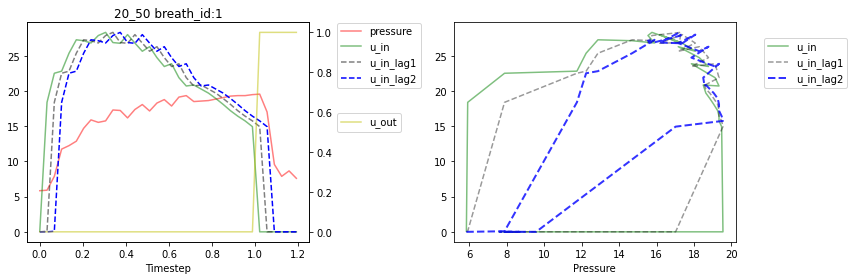

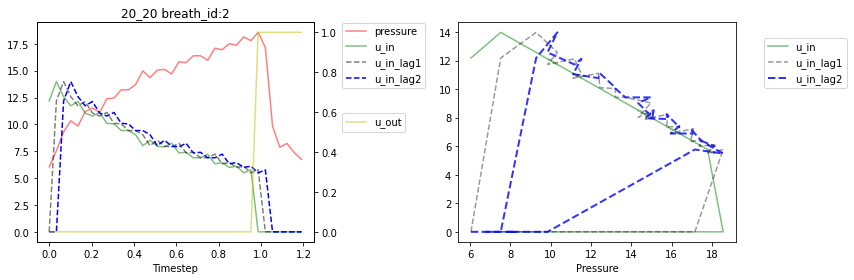

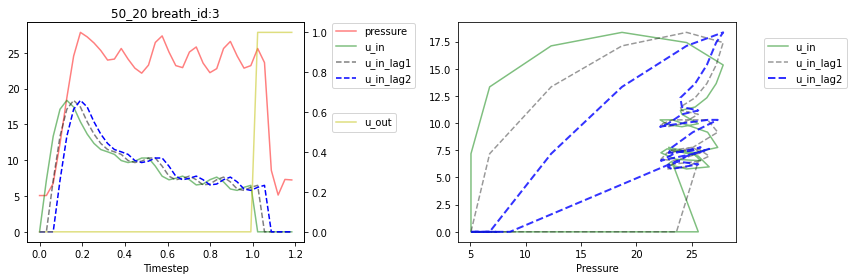

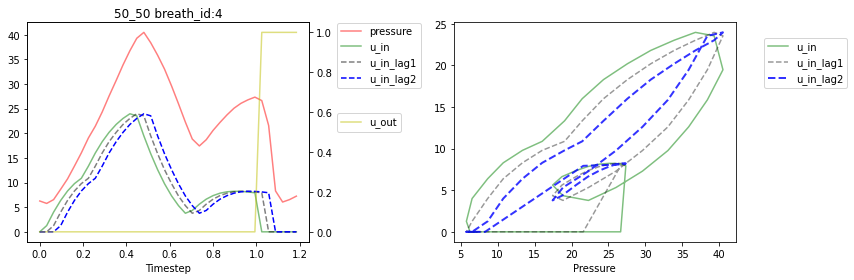

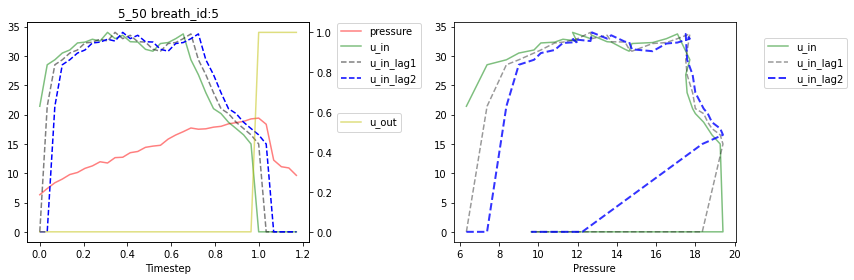

In [24]:
# u_in_lag2 generally has smaller/narrower inside contour plots along 45 degree, better correlated with pressure  
for bid in bid_list[:5]:
    plot2_bid(bid)

Compared to the left shifting plots, the right plots are easier to show the improvement due to lag2: shrunk blue area, eg breath_id 1 and 4.

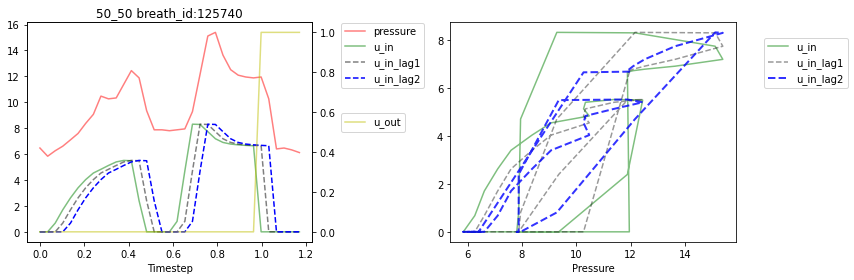

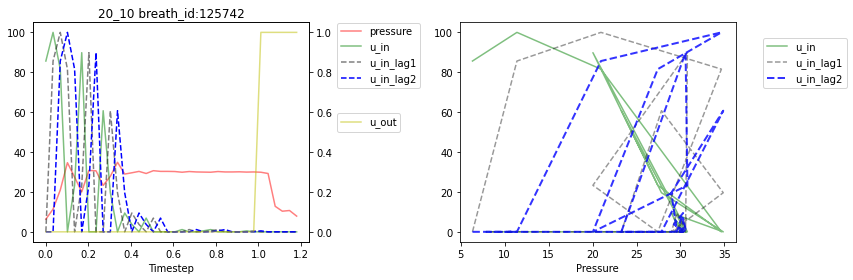

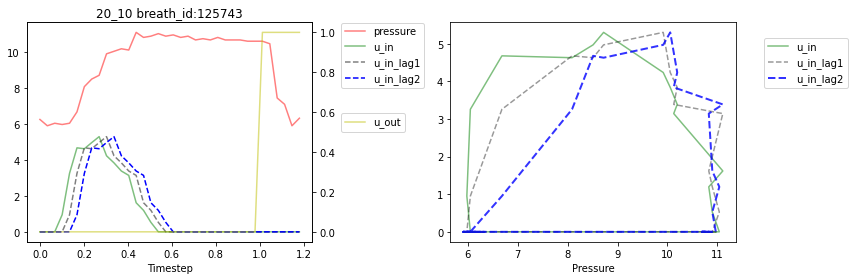

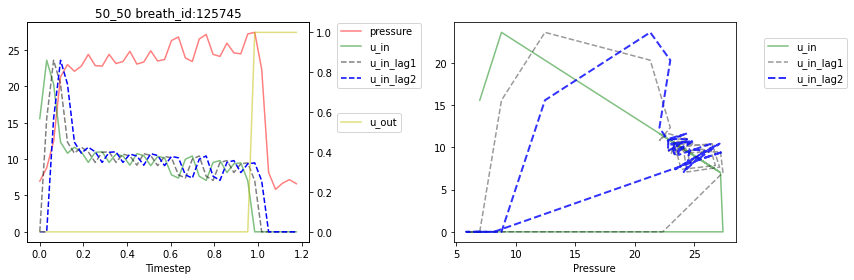

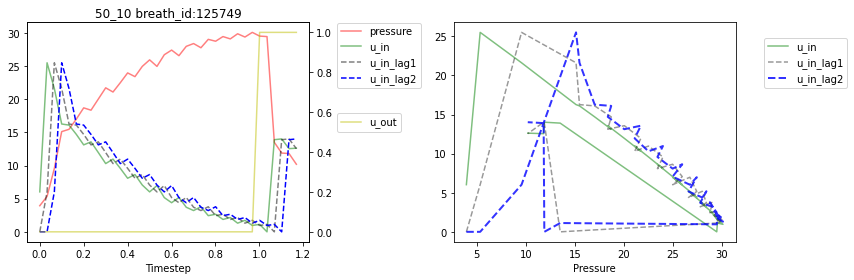

In [25]:
#bottom 5 instances

for bid in bid_list[-5:]:
    plot2_bid(bid)

### u_in_lag3

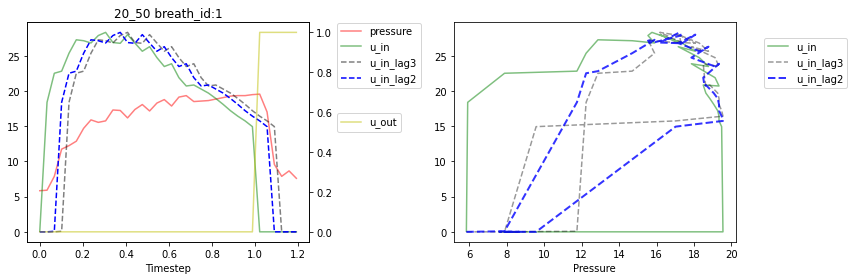

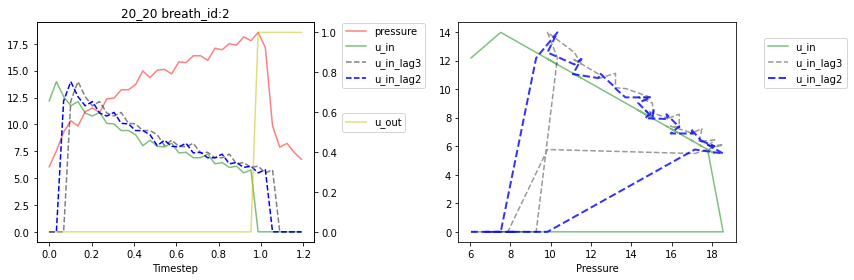

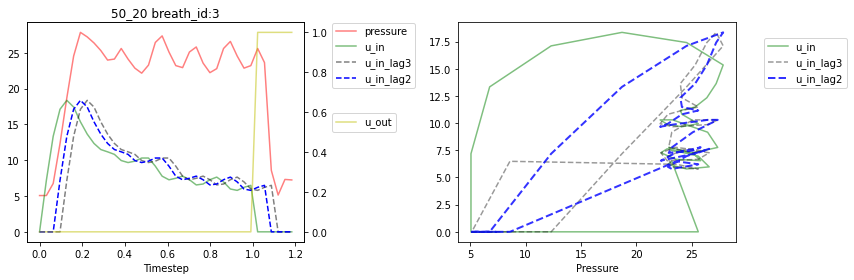

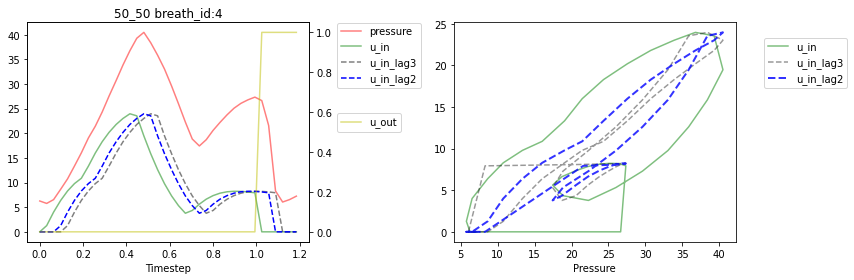

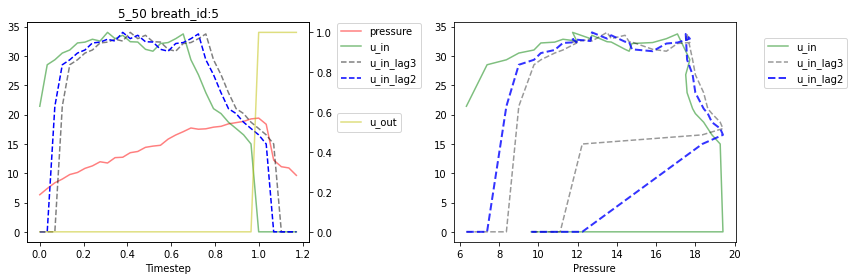

In [26]:
# u_in_lag3:  mixed/cross patterns
for bid in bid_list[:5]:
    plot2_bid(bid, cols =['u_in_lag3','u_in_lag2'])

### u_in_lag4

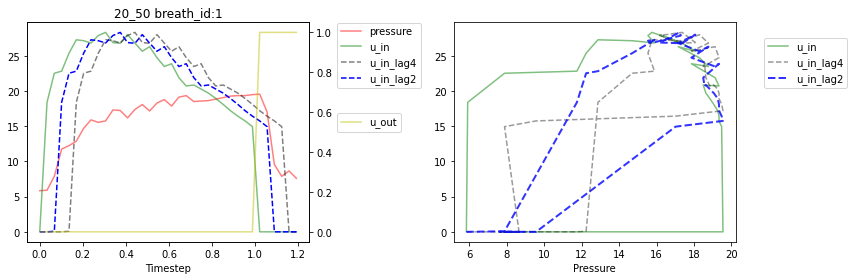

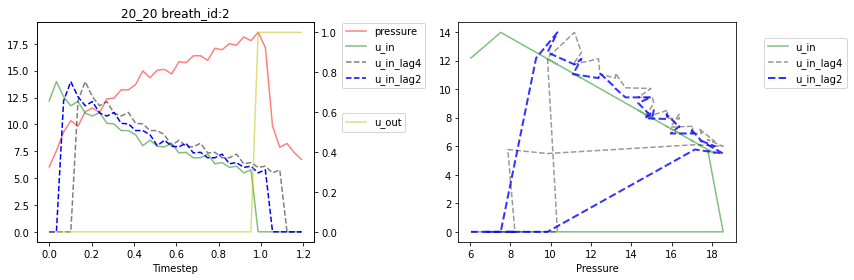

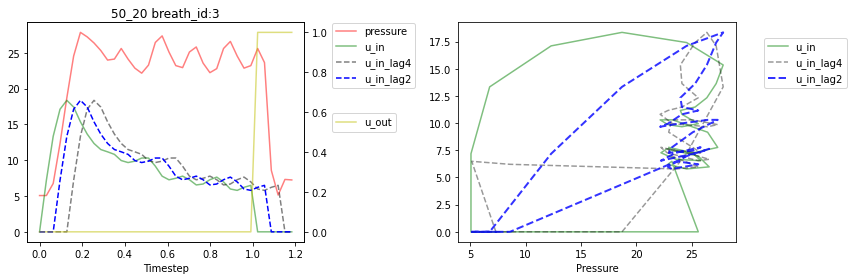

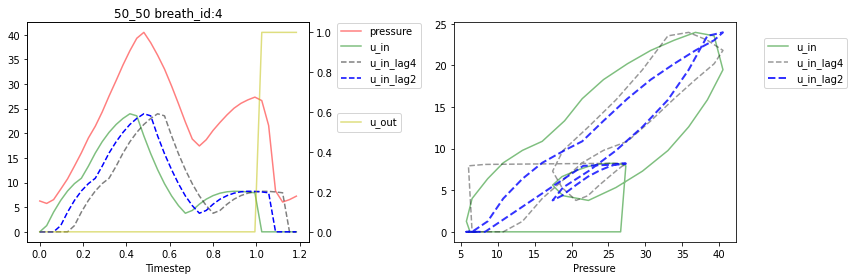

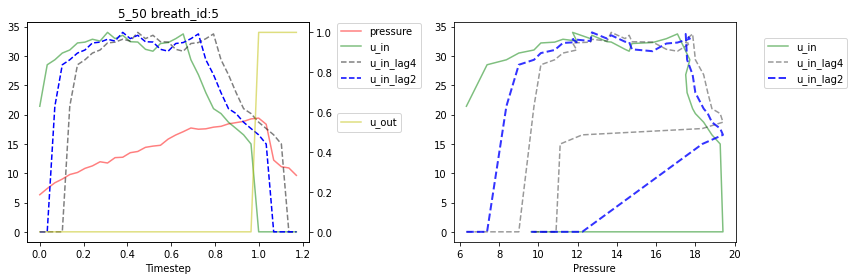

In [27]:
# u_in_lag4 looks too aggressive?
for bid in bid_list[:5]:
    plot2_bid(bid, cols =['u_in_lag4','u_in_lag2'])

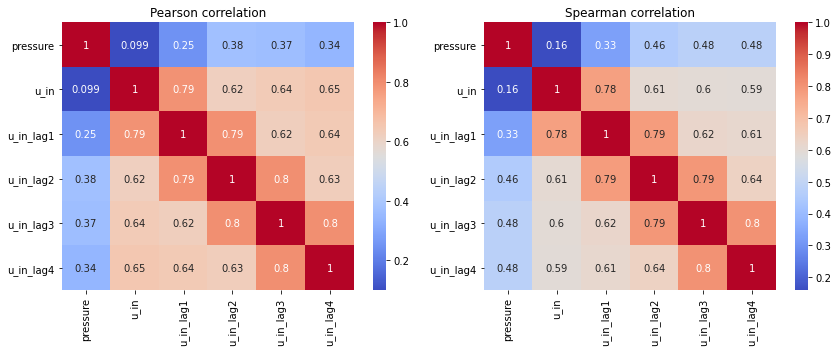

In [47]:
# Overall when u_out == 0

cols = ['pressure', 'u_in', 'u_in_lag1', 'u_in_lag2', 'u_in_lag3', 'u_in_lag4']
RC_list = train_df['RC'].unique()

a = train_df.loc[train_df['u_out'] == 0,cols]
fig, ax = plt.subplots(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(a.corr(), cmap='coolwarm', annot=True)
plt.title('Pearson correlation')
plt.subplot(1, 2, 2)
sns.heatmap(a.corr(method="spearman"), cmap='coolwarm', annot=True)
plt.title('Spearman correlation')
plt.tight_layout()

There seem similar levels of correlations between parametric pearson and non-parametric spearman methods.

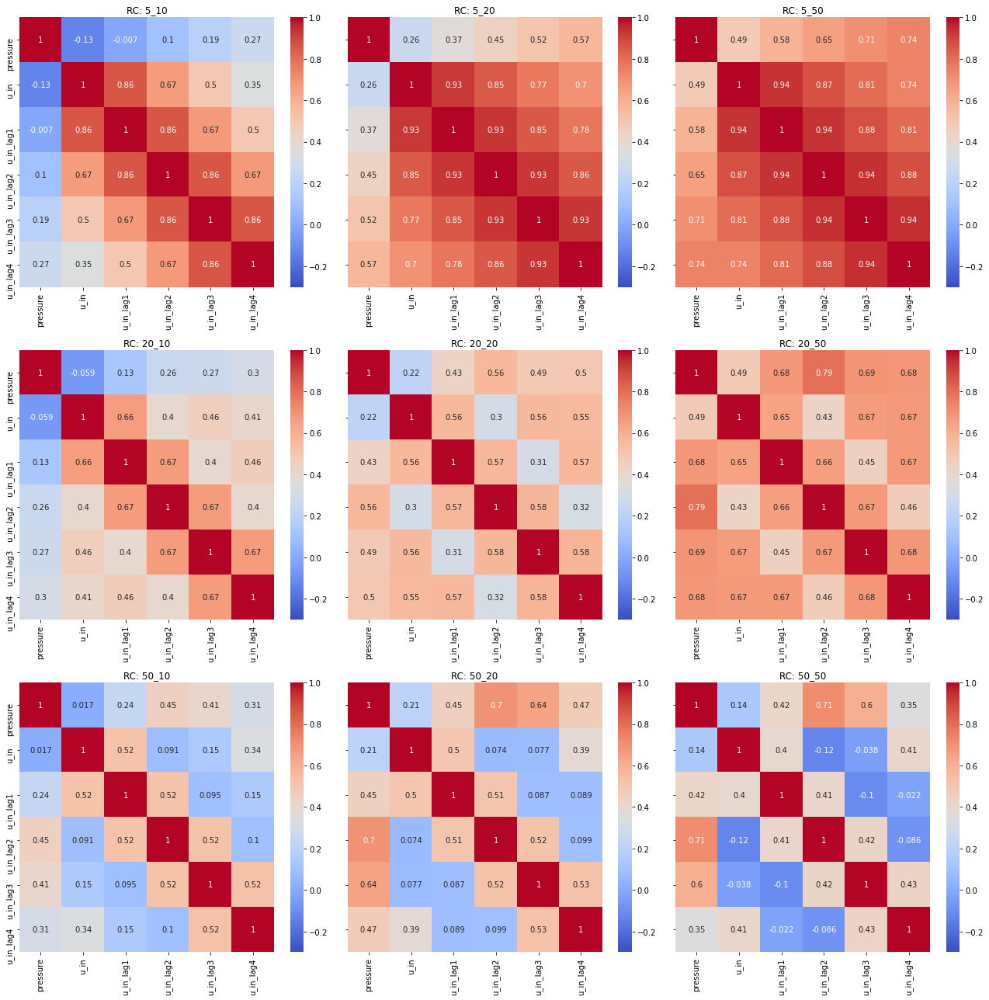

In [30]:
# RC Subsets Correlation

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18,18),  sharey=True) # sharex=True,
for i, ax in enumerate(axes.flatten()):
    a = train_df.loc[(train_df['u_out'] == 0) & (train_df['RC'] == RC_order[i]) ,cols]
    sns.heatmap(data=a.corr(), cmap='coolwarm', annot=True, ax=ax,
                vmin=-0.3, vmax=1,
               ) 
    #plt.yticks(rotation=90)
    ax.set_title(f'RC: {RC_order[i]}')
    
fig.tight_layout()
plt.show()

Lag2 wins 6 times out of 9 subsets and is expected to work well at R in (20, 50).

Still at medium high corr: 0.45 (5_20) and 0.65 (5_50). lag2 correlats well with lag4 when C > 10. So the net benifit may be small if both lag2 and lag 4 in the model.

5_10 subset: low or near-zero corr

Lag4 wins the remaing 3 subests with R = 5.

Low resistence R = 5 has very high correlations (>0.8) between neighboring lags.

Based on the corr heatmaps, more breath_id plots from two subsets with distinct patterns: top left and bottom right.

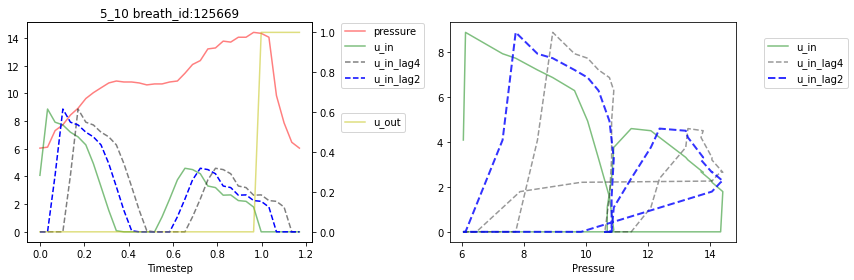

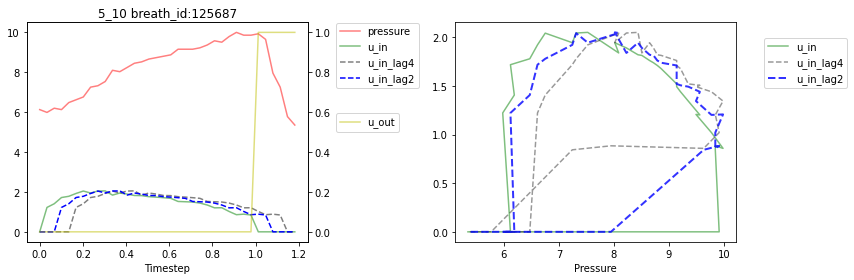

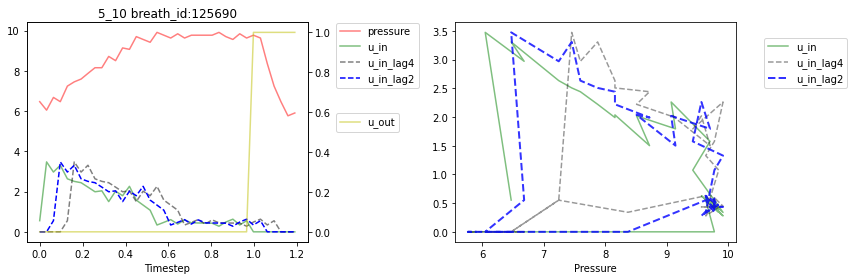

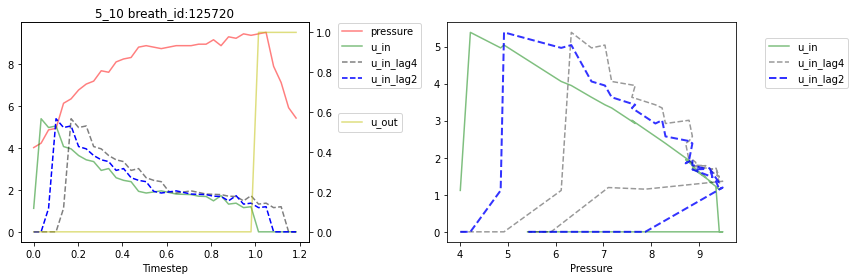

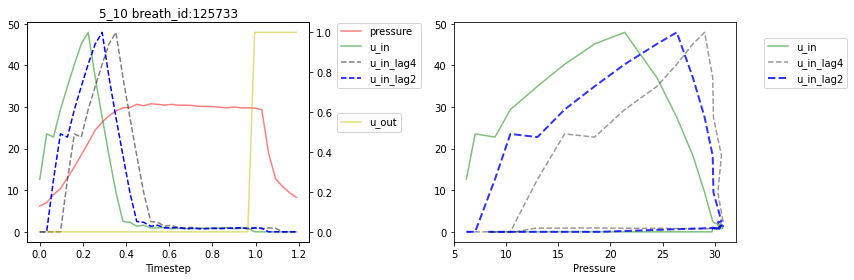

In [31]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '5_10', 'breath_id'].unique())
for bid in bid_list_lowCorr[-5:]:
    plot2_bid(bid, cols =['u_in_lag4','u_in_lag2'])

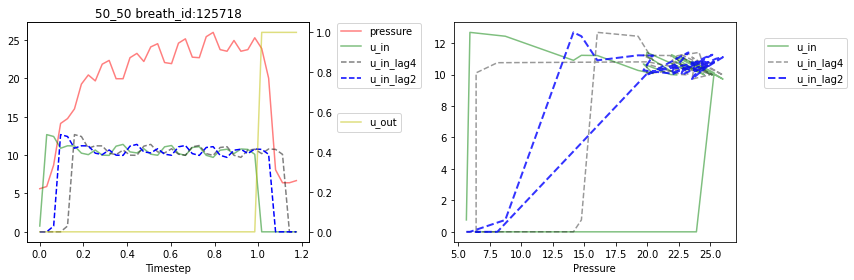

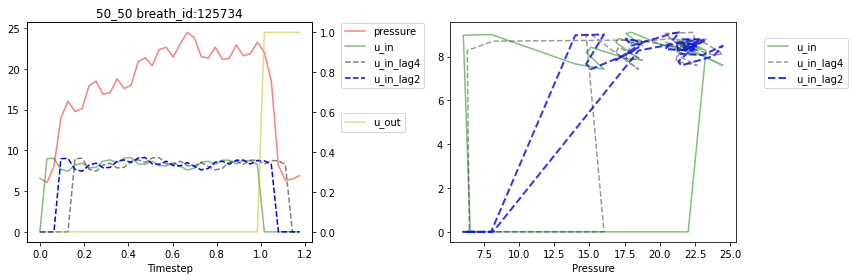

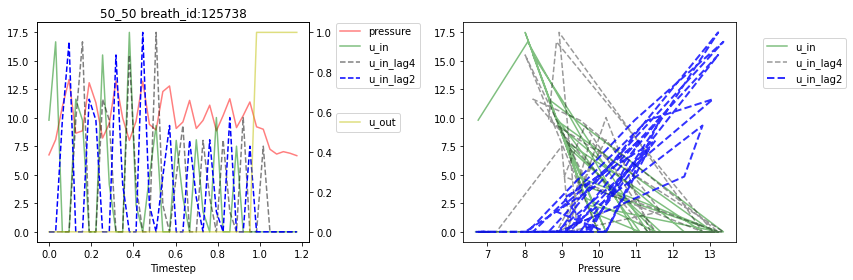

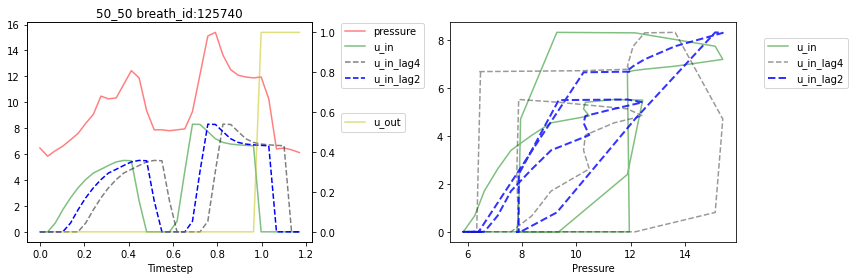

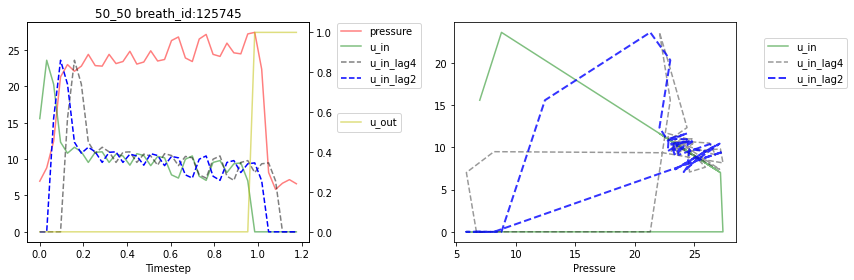

In [33]:
bid_list_highCorr = list(train_df.loc[train_df['RC'] == '50_50', 'breath_id'].unique())
for bid in bid_list_highCorr[-5:]:
    plot2_bid(bid, cols =['u_in_lag4','u_in_lag2'])

### Correlation <0.5 min

Patterns may be different during ramp and PIP/plateau stages.

In [48]:
time_step_max0 = round(train_df.loc[(train_df['u_out'] == 0), 'time_step'].max(),2)
time_step_max0

1.0

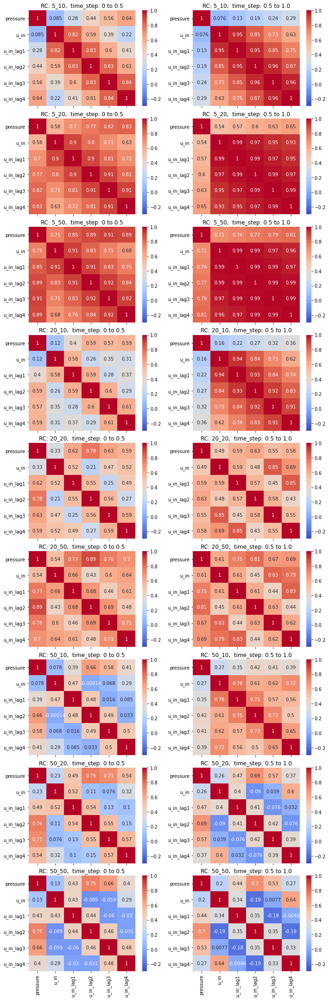

In [36]:
fig, axes = plt.subplots(nrows=len(RC_order), ncols=2, figsize=(10, 30),  sharex=True) # sharex=True,
for i, ax in enumerate(axes.flatten()):
    time_step_start = []
    time_step_end = []
    if i % 2 == 0:
        time_step_start = 0
        time_step_end = 0.5
    else:
        time_step_start = 0.5
        time_step_end = time_step_max0
    a = train_df.loc[(train_df['u_out'] == 0) & 
                  (train_df['RC'] == RC_order[int(i / 2)]) &
                  (train_df['time_step'] >= time_step_start) &
                  (train_df['time_step'] < time_step_end)
                  ,cols]
    sns.heatmap(data=a.corr(), cmap='coolwarm', annot=True, ax=ax,
                vmin=-0.3, vmax=1,
               ) 
    ax.set_title(f'RC: {RC_order[int(i / 2)]},  time_step: {time_step_start} to {time_step_end}')
    
fig.tight_layout()
plt.show()

As expected,u_in features tend to have larger preditive power during the early ramp stage (time_step < 0.5 or earlier).

Lag2 still the winner most of the time. It is OK in the early stage for5_10 subset, where lag4 seems the best though.

-- Different optimal lag amounts for some subsets?

### cumsum, area, cummean

Some subsets (e.g. 5_10) are expected to be correlared better by cumulative features than u_in_lag2

In [49]:
train_df.columns

Index(['id', 'breath_id', 'R', 'C', 'time_step', 'u_in', 'u_out', 'pressure',
       'RC', 'u_in_lag1', 'u_in_lag2', 'u_in_lag3', 'u_in_lag4', 'area',
       'cumsum', 'step', 'cummean'],
      dtype='object')

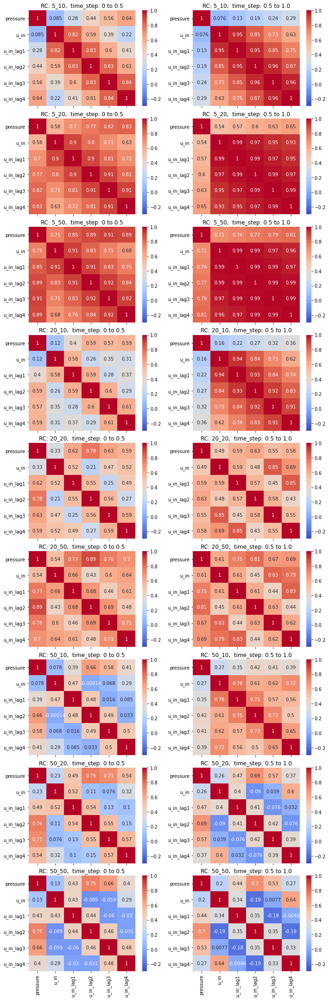

In [50]:
fig, axes = plt.subplots(nrows=len(RC_order), ncols=2, figsize=(10, 30),  sharex=True) # sharex=True,
for i, ax in enumerate(axes.flatten()):
    time_step_start = []
    time_step_end = []
    if i % 2 == 0:
        time_step_start = 0
        time_step_end = 0.5
    else:
        time_step_start = 0.5
        time_step_end = time_step_max0
    a = train_df.loc[(train_df['u_out'] == 0) & 
                  (train_df['RC'] == RC_order[int(i / 2)]) &
                  (train_df['time_step'] >= time_step_start) &
                  (train_df['time_step'] < time_step_end)
                  ,cols]
    sns.heatmap(data=a.corr(), cmap='coolwarm', annot=True, ax=ax,
                vmin=-0.3, vmax=1,
               ) 
    ax.set_title(f'RC: {RC_order[int(i / 2)]},  time_step: {time_step_start} to {time_step_end}')
    
fig.tight_layout()
plt.show()

cumsum has extremely high correlations for 5_10 subset which u_in_lag2 may fail.

cumsum correlates very high during the entire 1 min.

cummean consistently correlates higher later stage, after 0.5 min.

In [51]:
# revsit subset R=5, C=10

cols_raw = ['u_in', 'u_in_lag2', 'area', 'cumsum', 'cummean']

In [53]:
# RobustScale() will produce negative values for most cumsum and different range for cumsum and lag2
# scaler = RobustScaler()
# train[cols_raw] = scaler.fit_transform(train[cols_raw])
# train[cols_raw] = scaler.inverse_transform(train[cols_raw])

scaler = MinMaxScaler()
train_df[cols_raw] = scaler.fit_transform(train_df[cols_raw]) * 5

In [54]:
train_df[cols_raw].describe()

,u_in,u_in_lag2,area,cumsum,cummean
count,6.036000e+06,6.036000e+06,6.036000e+06,6.036000e+06,6.036000e+06
mean,3.660807e-01,3.601974e-01,5.645593e-01,7.456620e-01,6.283932e-01
std,6.717351e-01,6.738360e-01,6.037938e-01,7.601884e-01,7.215908e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.968311e-02,0.000000e+00,1.176069e-01,2.476191e-01,1.954061e-01
50%,2.193073e-01,2.096802e-01,3.648718e-01,5.057806e-01,3.697884e-01
75%,2.491947e-01,2.488708e-01,8.239282e-01,9.448174e-01,7.592557e-01
max,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00


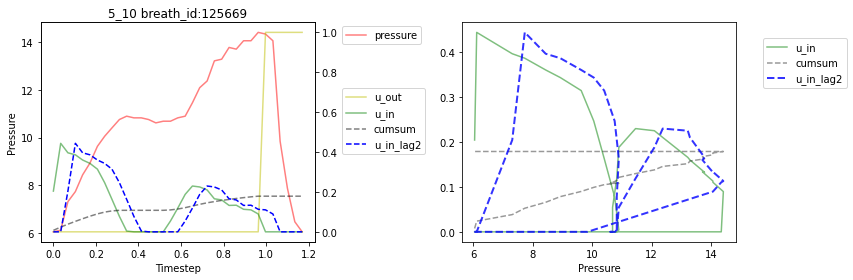

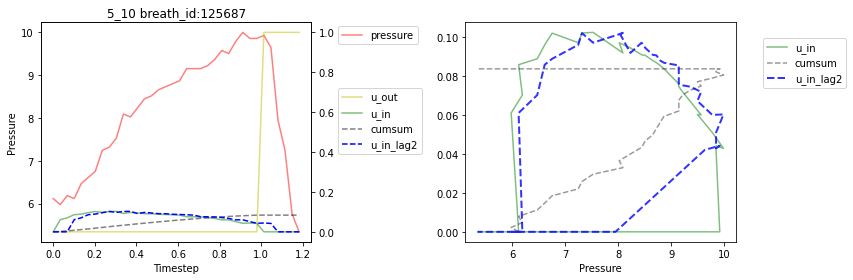

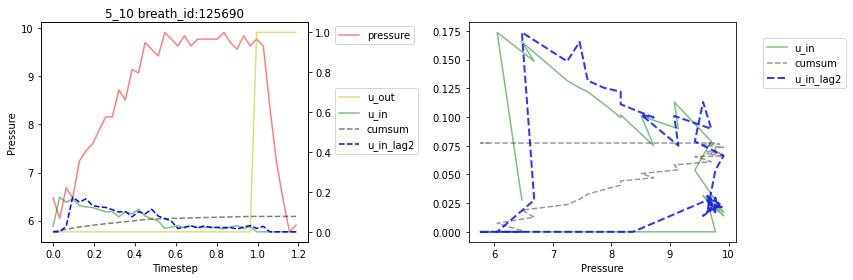

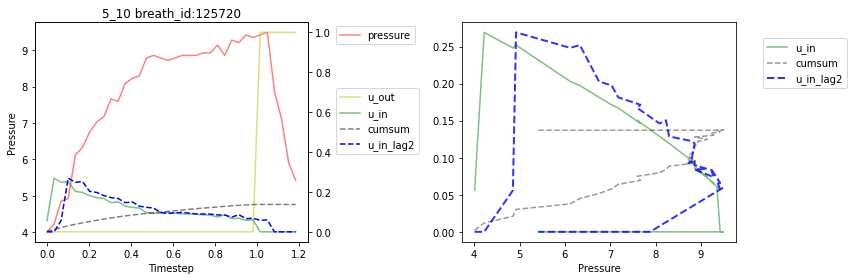

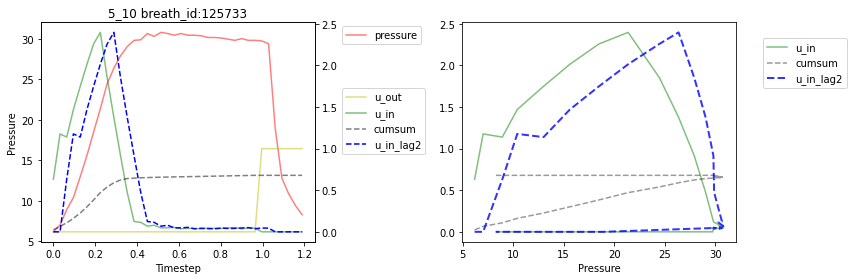

In [55]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '5_10', 'breath_id'].unique())
for bid in bid_list_lowCorr[-5:]:
    plot2_bid_scaled(bid, cols =['cumsum','u_in_lag2'])

High correlation (>0.9) between pressure and cumsum when R=5 and C=10! (straight up line on the right plot of cumsum ~ pressure).

### cummean

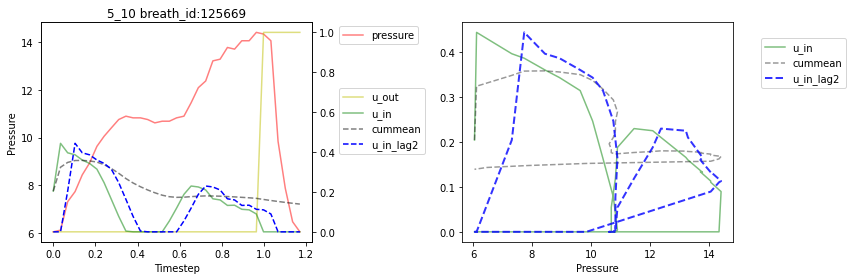

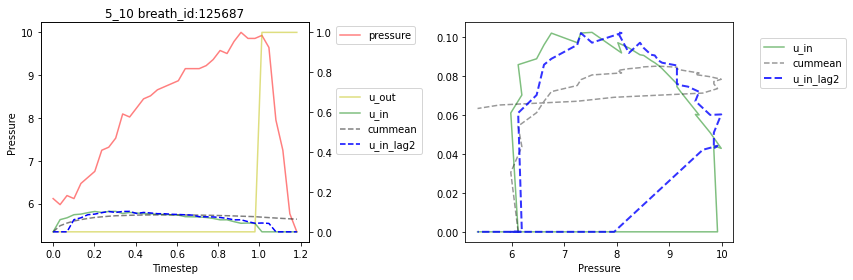

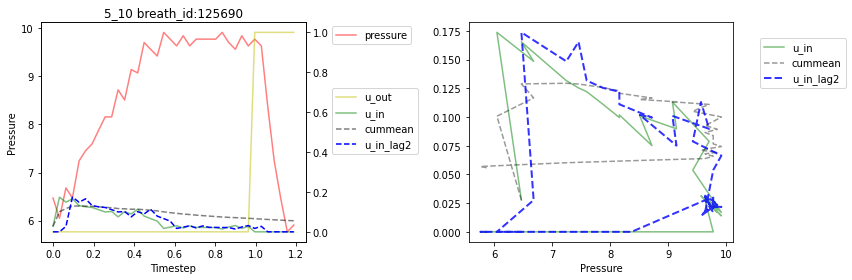

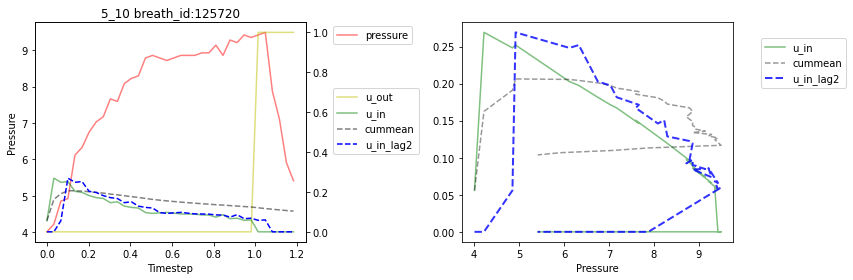

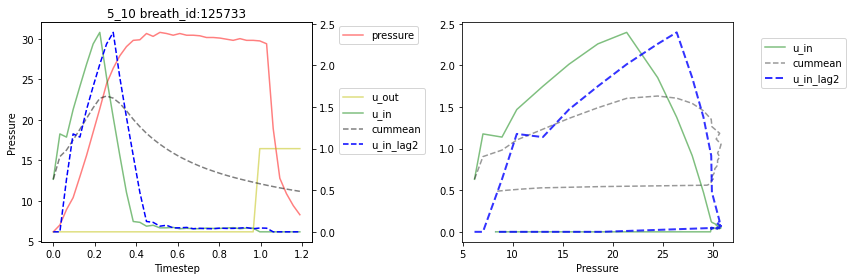

In [56]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '5_10', 'breath_id'].unique())
for bid in bid_list_lowCorr[-5:]:
    plot2_bid_scaled(bid, cols =['cummean','u_in_lag2'])

### cummean vs cumsum

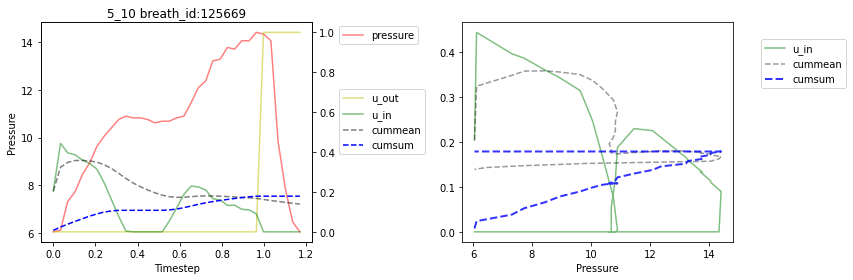

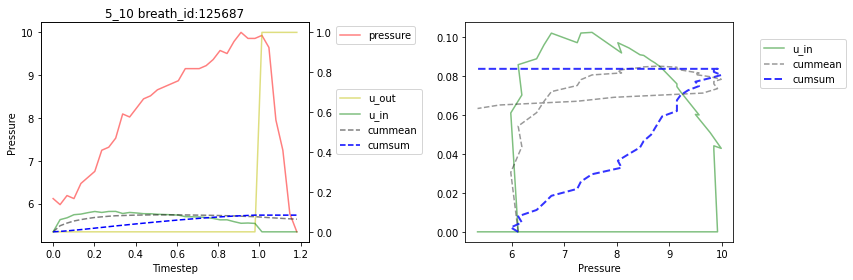

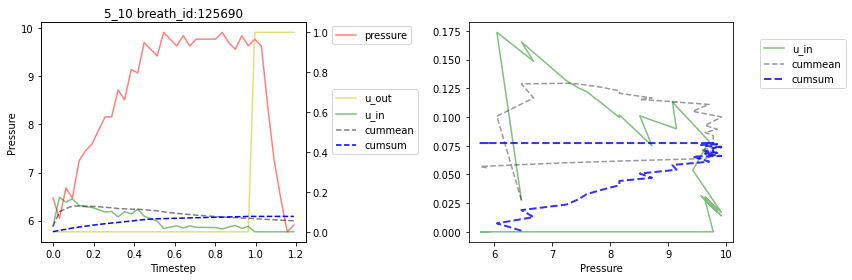

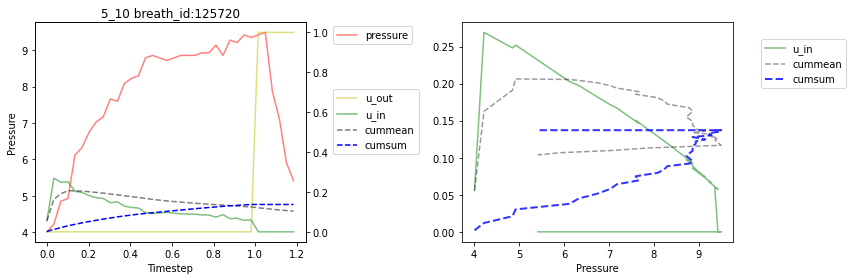

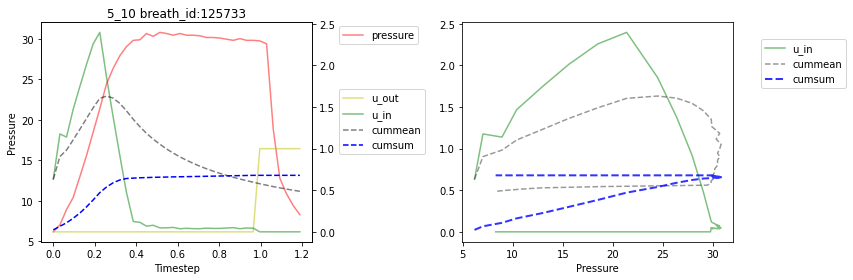

In [57]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '5_10', 'breath_id'].unique())
for bid in bid_list_lowCorr[-5:]:
    plot2_bid_scaled(bid, cols =['cummean','cumsum'])

One of two subsets with less instances in train data for RC: 20_10


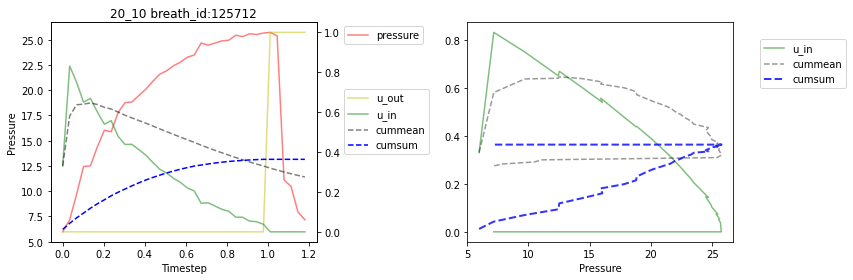

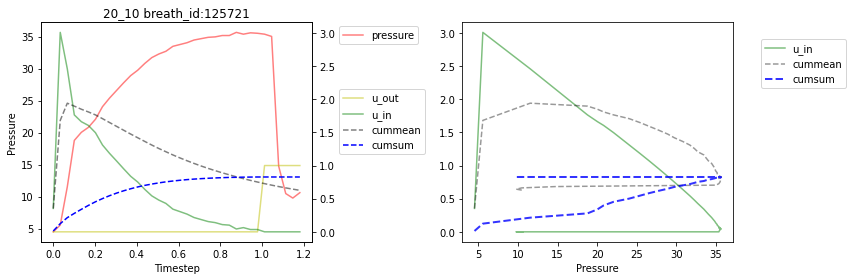

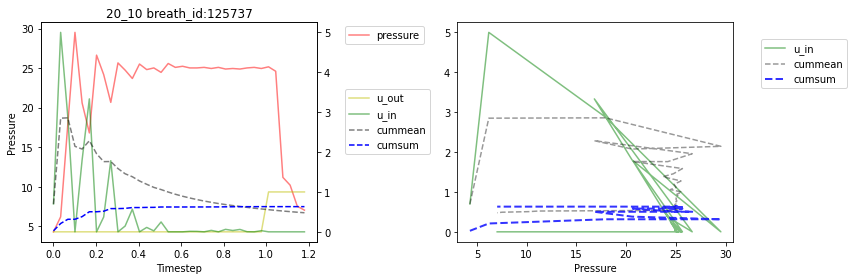

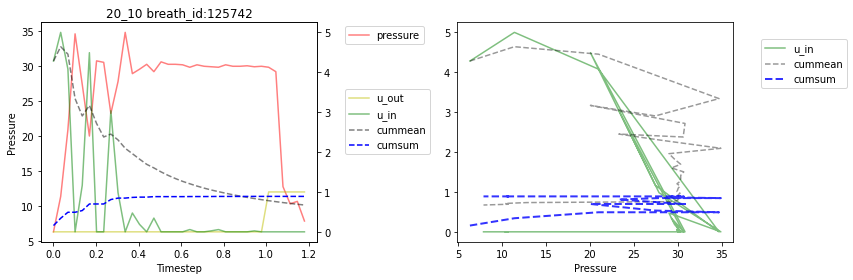

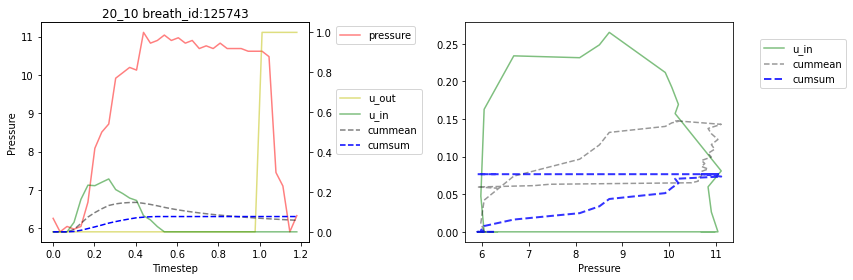

In [61]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '20_10', 'breath_id'].unique())
print('One of two subsets with less instances in train data for RC: 20_10')
for bid in bid_list_lowCorr[-5:]:
    plot2_bid_scaled(bid, cols =['cummean','cumsum'])

One of two subsets with less instances in train data for RC: 20_20


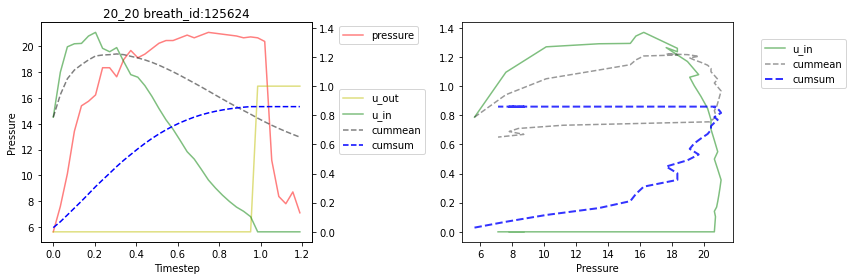

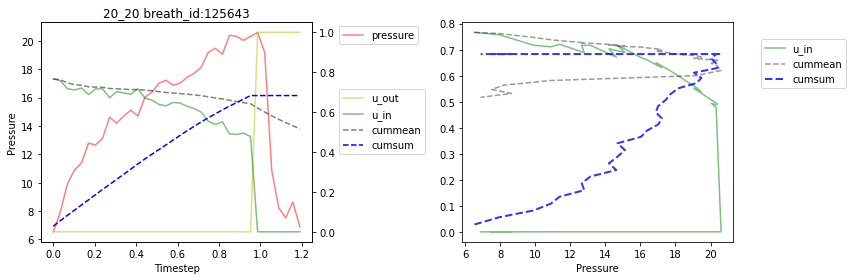

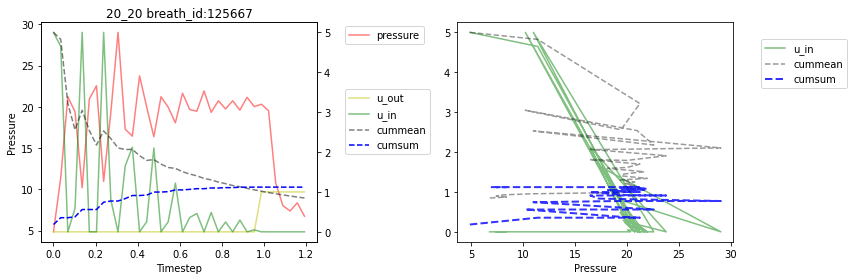

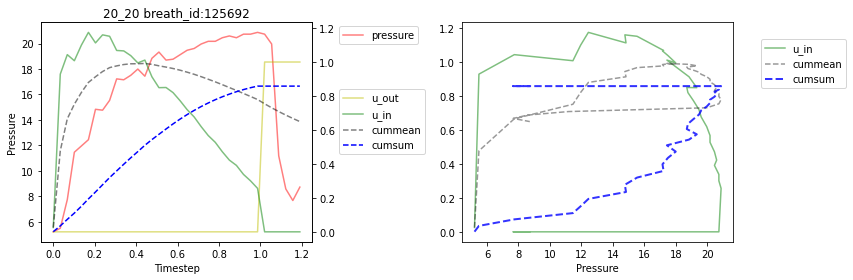

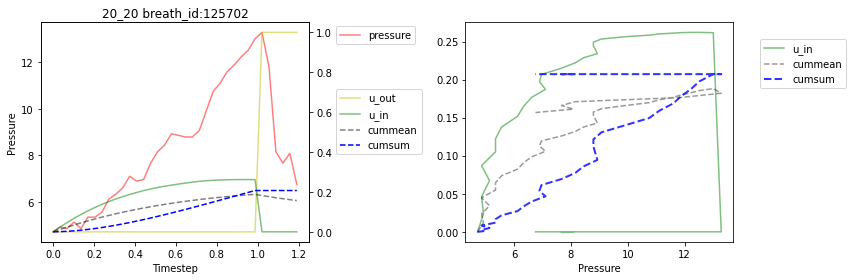

In [60]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '20_20', 'breath_id'].unique())
print('One of two subsets with less instances in train data for RC: 20_20')
for bid in bid_list_lowCorr[-5:]:
    plot2_bid_scaled(bid, cols =['cummean','cumsum'])

The subset with largest instances in train data for RC: 50_10


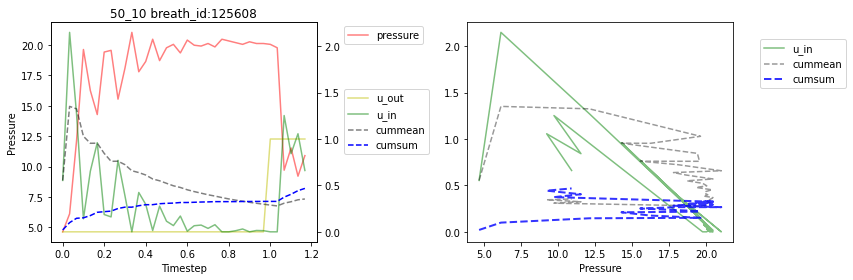

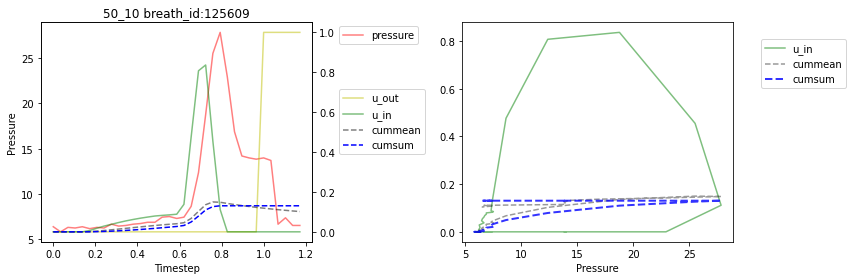

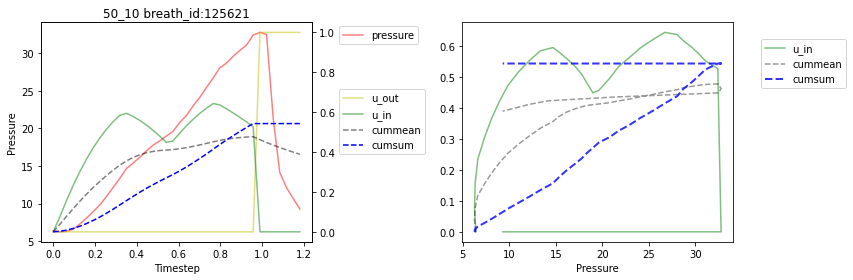

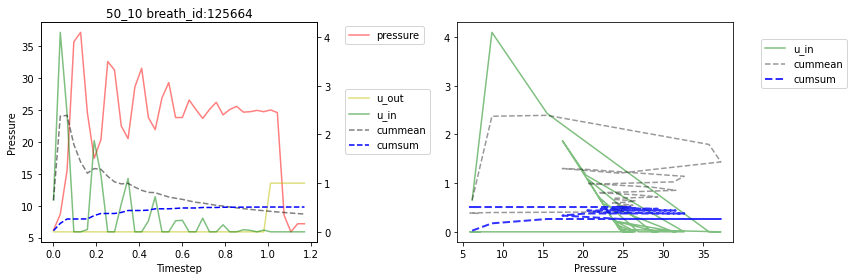

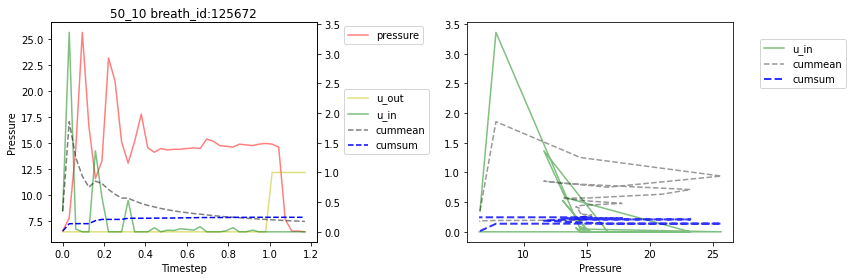

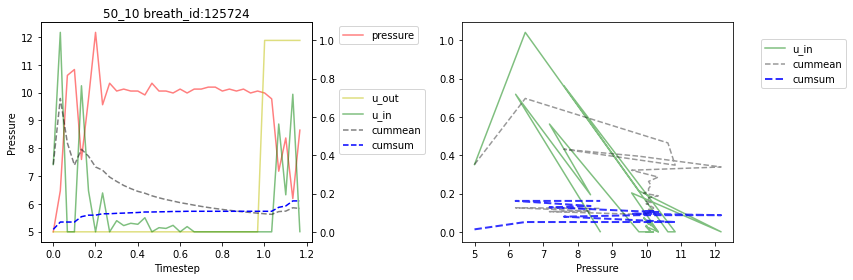

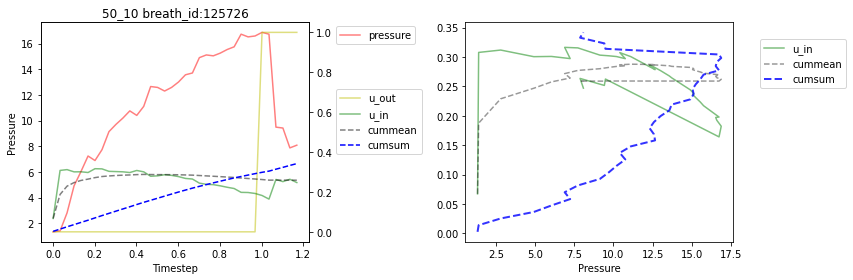

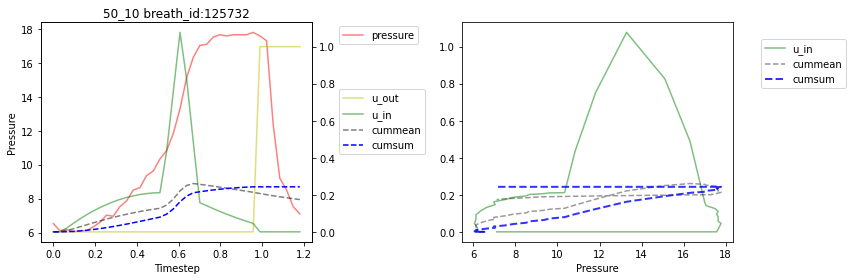

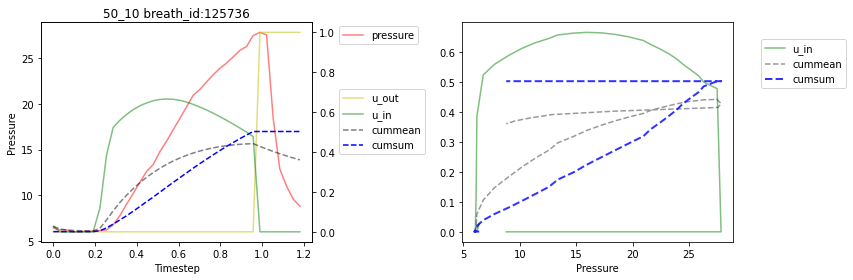

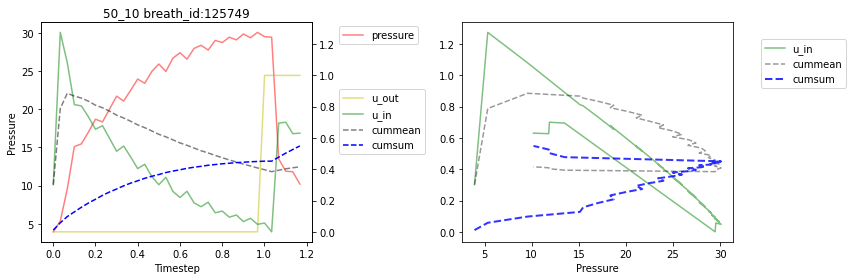

In [62]:
bid_list_lowCorr = list(train_df.loc[train_df['RC'] == '50_10', 'breath_id'].unique())
print('The subset with largest instances in train data for RC: 50_10')
for bid in bid_list_lowCorr[-10:]:
    plot2_bid_scaled(bid, cols =['cummean','cumsum'])

https://www.kaggle.com/carlmcbrideellis/ventilator-pressure-eda-and-simple-submission

In this competition we are provided with 75,450 non-contiguous cycles (each cycle is uniquely labelled with an individual breath_id) of the PVP1 automated ventilator connected to a high-grade test lung (Quicklung, Ingmar Medical) Three different values of the compliance (C) were tested [10,20,50] mL cm H2O in conjunction with three different values of resistance (R) [5,20,50] cm H2O/L/s, resulting in a total of 9 different lung settings.

A cycle lasts for up to 3 seconds. It is the inspiratory section (from 0-1 seconds) that we model in this competition.

When it comes to model evaluation we have to predict the pressure for 50,300 test cycles, of which 19% are assigned to the Public Leaderboard, and the remaining 81% to the Private Leaderboard.

In [83]:
train_data= pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [84]:
train_data.groupby("breath_id")["time_step"].count().unique().item()

80

In [85]:
test_data.groupby("breath_id")["time_step"].count().unique().item()   

80

### Find Missing Value

In [86]:
train_data.isnull().sum(axis = 0).to_frame()

,0
id,0
breath_id,0
R,0
C,0
time_step,0
u_in,0
u_out,0
pressure,0


In [87]:
#How long does longest breath last?

train_data.time_step.max()

2.9372379779815674

The longest breath is just under 3 seconds.

In [88]:
# What is the maximum time that the exploratory solenoid valve (u_out) is set to 0?

train_data.query('u_out == 0').time_step.max()

0.999798059463501

The valve seems to be activated after 1 seccond.

In [89]:
# for 1st Breath

breath_one = train_data.query('breath_id == 1').reset_index(drop = True)
breath_one

,id,breath_id,R,C,time_step,u_in,u_out,pressure
0,1,1,20,50,0.000000,0.083334,0,5.837492
1,2,1,20,50,0.033652,18.383041,0,5.907794
2,3,1,20,50,0.067514,22.509278,0,7.876254
3,4,1,20,50,0.101542,22.808822,0,11.742872
4,5,1,20,50,0.135756,25.355850,0,12.234987
...,...,...,...,...,...,...,...,...
75,76,1,20,50,2.553593,4.974474,1,6.399909
76,77,1,20,50,2.587754,4.978481,1,6.610815
77,78,1,20,50,2.621773,4.981847,1,6.329607
78,79,1,20,50,2.655746,4.984683,1,6.540513


In [90]:
breath_one.nunique().to_frame()

,0
id,80
breath_id,1
R,1
C,1
time_step,80
u_in,66
u_out,2
pressure,55


there is only one value for R, one value for C for the breath_id.

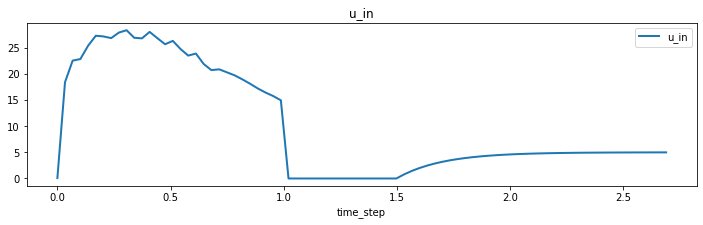

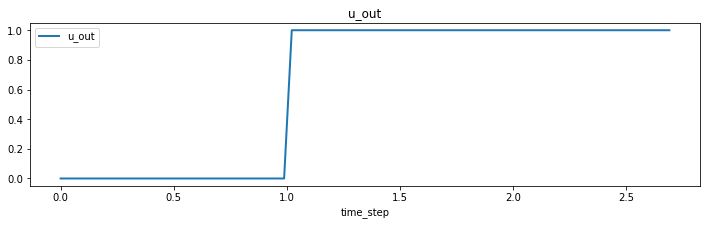

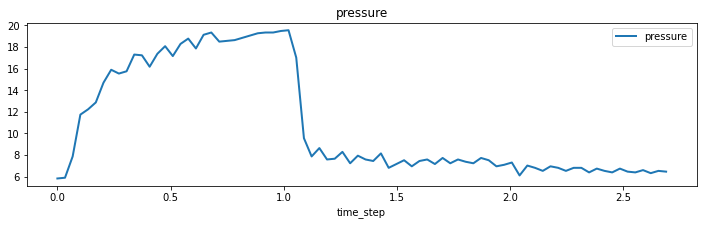

In [91]:
breath_one.plot(x="time_step", y="u_in", kind='line',figsize=(12,3), lw=2, title="u_in");
breath_one.plot(x="time_step", y="u_out", kind='line',figsize=(12,3), lw=2, title="u_out");
breath_one.plot(x="time_step", y="pressure", kind='line',figsize=(12,3), lw=2, title="pressure");

In [92]:
# What values do we have for R, which represents how restricted the airway is (in cmH2O/L/S)?

train_data.R.value_counts().to_frame()

,R
50,2410080
5,1988800
20,1637120


In [93]:
train_data.C.value_counts().to_frame()

,C
10,2244720
50,1971680
20,1819600


In [94]:
# for u_out, the control input for the exploratory solenoid valve. Either 0 or 1.
train_data.u_out.value_counts().to_frame()

,u_out
1,3745032
0,2290968


The pressure is measured in cmH20, where 1 cmH20 is roughly equal to 98 Pascals. The maximum value of the pressure is

In [95]:
train_data.pressure.max()

64.8209917386395

which corresponds to around 6,350 Pa.

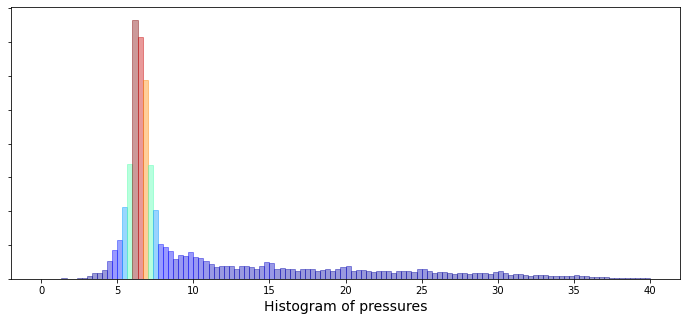

In [96]:
plt.figure(figsize = (12,5))
ax = sns.distplot(train_data['pressure'], 
             bins=120, 
             kde_kws={"clip":(0,40)}, 
             hist_kws={"range":(0,40)},
             color='darkcyan', 
             kde=False);
values = np.array([rec.get_height() for rec in ax.patches])
norm = plt.Normalize(values.min(), values.max())
colors = plt.cm.jet(norm(values))
for rec, col in zip(ax.patches, colors):
    rec.set_color(col)
plt.xlabel("Histogram of pressure", size=14)
ax.set(yticklabels=[])
plt.show();

with a Median Value of

In [97]:
train_data.pressure.median()

7.032628177739799

the expiratory phase is not scored, so for practical purposes we are only really interested in the pressure for u_out=0, i.e. the first second of the experiments:

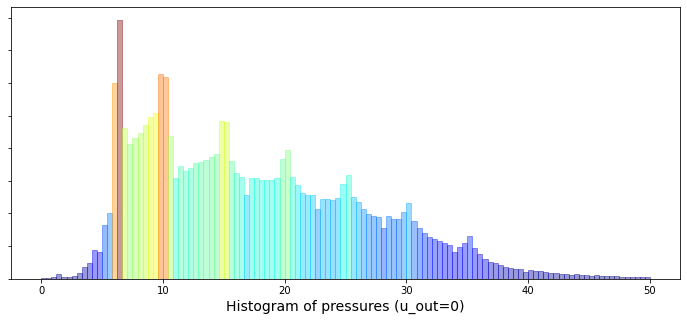

In [98]:
u_out_is_zero = train_data.query("u_out == 0").reset_index(drop = True)
plt.figure(figsize = (12,5))
ax = sns.distplot(u_out_is_zero['pressure'], 
             bins=120, 
             kde_kws={"clip":(0,50)}, 
             hist_kws={"range":(0,50)},
             color='darkcyan', 
             kde=False);
values = np.array([rec.get_height() for rec in ax.patches])
norm = plt.Normalize(values.min(), values.max())
colors = plt.cm.jet(norm(values))
for rec, col in zip(ax.patches, colors):
    rec.set_color(col)
plt.xlabel("Histogram of pressure (u_out=0)", size=14)
ax.set(yticklabels=[])
plt.show();

with Median value of

In [99]:
u_out_is_zero.pressure.median()

15.82039635914182

We have nine combinations of experiments; C can be 10, 20 or 50, and R can be 5, 20 or 50. Lets take a quick look at an example of each

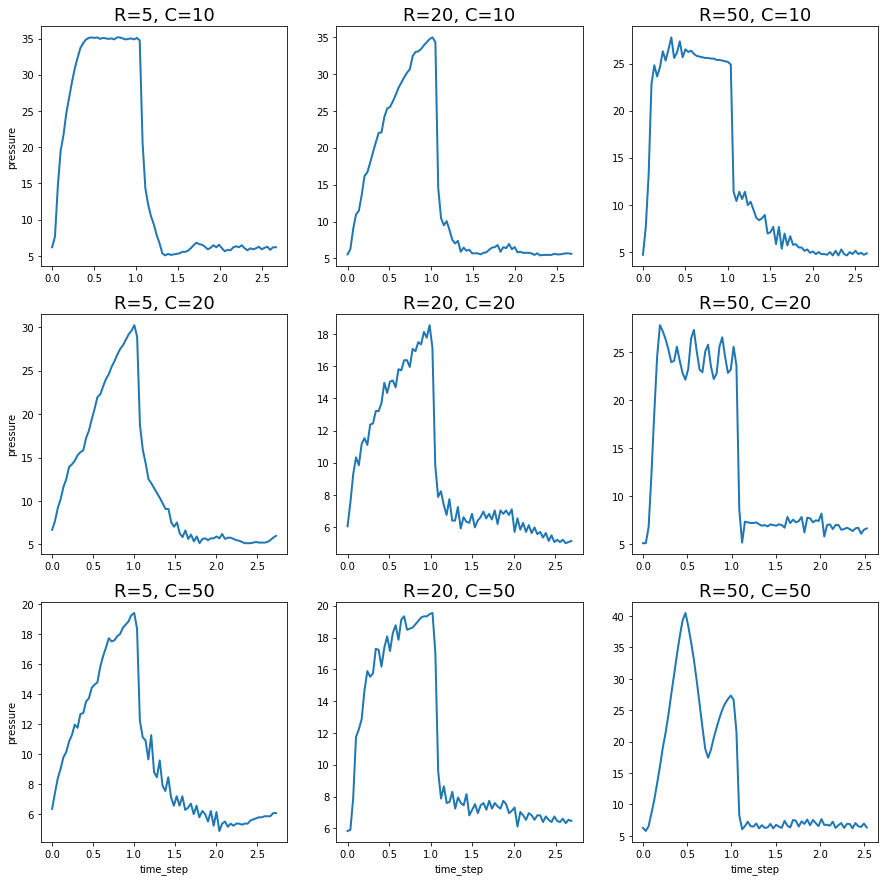

In [100]:
breath_2 = train_data.query('breath_id == 2').reset_index(drop = True)
breath_3 = train_data.query('breath_id == 3').reset_index(drop = True)
breath_4 = train_data.query('breath_id == 4').reset_index(drop = True)
breath_5 = train_data.query('breath_id == 5').reset_index(drop = True)
breath_17 = train_data.query('breath_id == 17').reset_index(drop = True)
breath_18 = train_data.query('breath_id == 18').reset_index(drop = True)
breath_21 = train_data.query('breath_id == 21').reset_index(drop = True)
breath_39 = train_data.query('breath_id == 39').reset_index(drop = True)

fig, axes = plt.subplots(3,3,figsize=(15,15))
sns.lineplot(data=breath_39, x="time_step", y="pressure", lw=2, ax=axes[0,0])
axes[0,0].set_title ("R=5, C=10", fontsize=18)
axes[0,0].set(xlabel='')
#axes[0,0].set(ylim=(0, None))
sns.lineplot(data=breath_21, x="time_step", y="pressure",  lw=2, ax=axes[0,1])
axes[0,1].set_title ("R=20, C=10", fontsize=18)
axes[0,1].set(xlabel='')
axes[0,1].set(ylabel='')
#axes[0,1].set(ylim=(0, None))
sns.lineplot(data=breath_18, x="time_step", y="pressure",  lw=2,ax=axes[0,2])
axes[0,2].set_title ("R=50, C=10", fontsize=18)
axes[0,2].set(xlabel='')
axes[0,2].set(ylabel='')
#axes[0,2].set(ylim=(0, None))
sns.lineplot(data=breath_17, x="time_step", y="pressure",  lw=2,ax=axes[1,0])
axes[1,0].set_title ("R=5, C=20", fontsize=18)
axes[1,0].set(xlabel='')
#axes[1,0].set(ylim=(0, None))
sns.lineplot(data=breath_2, x="time_step", y="pressure",  lw=2,ax=axes[1,1])
axes[1,1].set_title ("R=20, C=20", fontsize=18)
axes[1,1].set(xlabel='')
axes[1,1].set(ylabel='')
#axes[1,1].set(ylim=(0, None))
sns.lineplot(data=breath_3, x="time_step", y="pressure",  lw=2,ax=axes[1,2])
axes[1,2].set_title ("R=50, C=20", fontsize=18)
axes[1,2].set(xlabel='')
axes[1,2].set(ylabel='')
#axes[1,2].set(ylim=(0, None))
sns.lineplot(data=breath_5, x="time_step", y="pressure",  lw=2,ax=axes[2,0])
axes[2,0].set_title ("R=5, C=50", fontsize=18)
#axes[2,0].set(ylim=(0, None))
sns.lineplot(data=breath_one, x="time_step", y="pressure",  lw=2,ax=axes[2,1])
axes[2,1].set_title ("R=20, C=50", fontsize=18)
axes[2,1].set(ylabel='')
#axes[2,1].set(ylim=(0, None))
sns.lineplot(data=breath_4, x="time_step", y="pressure",  lw=2,ax=axes[2,2])
axes[2,2].set_title ("R=50, C=50", fontsize=18)
axes[2,2].set(ylabel='')
#axes[2,2].set(ylim=(0, None))

plt.show();

### Positive end-expiratory pressure (PEEP)

It is worth noting that even before the experiments start (i.e. the time_step=0 and u_in=0) there is a positive pressure in the airway. The system is maintained above atmospheric pressure to promote gas exchange to the lungs.

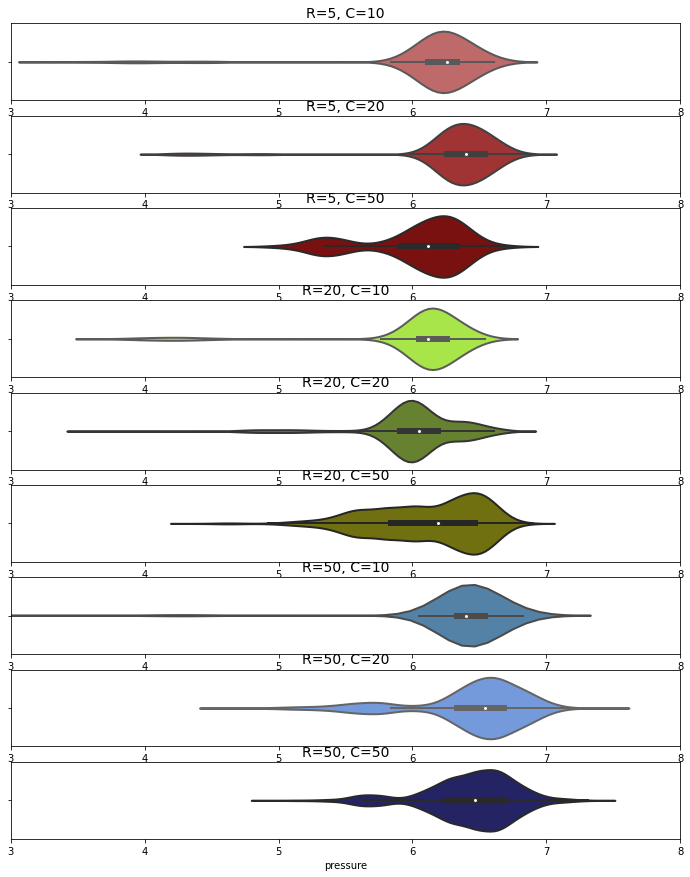

In [101]:
zero_time = train_data.query("time_step < 0.000001 & u_in < 0.000001").reset_index(drop = True)
zero_time_5_10  = zero_time.query("R ==  5 & C == 10").reset_index(drop = True)
zero_time_5_20  = zero_time.query("R ==  5 & C == 20").reset_index(drop = True)
zero_time_5_50  = zero_time.query("R ==  5 & C == 50").reset_index(drop = True)
zero_time_20_10 = zero_time.query("R == 20 & C == 10").reset_index(drop = True)
zero_time_20_20 = zero_time.query("R == 20 & C == 20").reset_index(drop = True)
zero_time_20_50 = zero_time.query("R == 20 & C == 50").reset_index(drop = True)
zero_time_50_10 = zero_time.query("R == 50 & C == 10").reset_index(drop = True)
zero_time_50_20 = zero_time.query("R == 50 & C == 20").reset_index(drop = True)
zero_time_50_50 = zero_time.query("R == 50 & C == 50").reset_index(drop = True)

fig, axes = plt.subplots(9,1,figsize=(12,15))
sns.violinplot(x=zero_time_5_10["pressure"], linewidth=2, ax=axes[0], color="indianred")
axes[0].set_title ("R=5, C=10", fontsize=14)
axes[0].set(xlim=(3, 8))
sns.violinplot(x=zero_time_5_20["pressure"], linewidth=2, ax=axes[1], color="firebrick")
axes[1].set_title ("R=5, C=20", fontsize=14)
axes[1].set(xlim=(3, 8))
sns.violinplot(x=zero_time_5_50["pressure"], linewidth=2, ax=axes[2], color="darkred" )
axes[2].set_title ("R=5, C=50", fontsize=14)
axes[2].set(xlim=(3, 8))
sns.violinplot(x=zero_time_20_10["pressure"], linewidth=2, ax=axes[3], color="greenyellow")
axes[3].set_title ("R=20, C=10", fontsize=14)
axes[3].set(xlim=(3, 8))
sns.violinplot(x=zero_time_20_20["pressure"], linewidth=2, ax=axes[4], color="olivedrab")
axes[4].set_title ("R=20, C=20", fontsize=14)
axes[4].set(xlim=(3, 8))
sns.violinplot(x=zero_time_20_50["pressure"], linewidth=2, ax=axes[5], color="olive" )
axes[5].set_title ("R=20, C=50", fontsize=14)
axes[5].set(xlim=(3, 8))
sns.violinplot(x=zero_time_50_10["pressure"], linewidth=2, ax=axes[6], color="steelblue")
axes[6].set_title ("R=50, C=10", fontsize=14)
axes[6].set(xlim=(3, 8))
sns.violinplot(x=zero_time_50_20["pressure"], linewidth=2, ax=axes[7], color="cornflowerblue")
axes[7].set_title ("R=50, C=20", fontsize=14)
axes[7].set(xlim=(3, 8))
sns.violinplot(x=zero_time_50_50["pressure"], linewidth=2, ax=axes[8], color="midnightblue" )
axes[8].set_title ("R=50, C=50", fontsize=14)
axes[8].set(xlim=(3, 8));

The average value of PEEP at the beginning of each cycle is

In [102]:
zero_time["pressure"].mean()

6.268396109353407

not all cycles start with u_in=0, and a cycle can even start with the inspiratory solenoid valve set to the maximum value of 100.

The minimum value for the pressure where u_in=0 at time_step=0 is

In [103]:
zero_time[zero_time['pressure']==zero_time['pressure'].min()]

,id,breath_id,R,C,time_step,u_in,u_out,pressure
114,28721,542,50,10,0.0,0.0,0,-1.825442
21863,5740241,119582,50,10,0.0,0.0,0,-1.825442


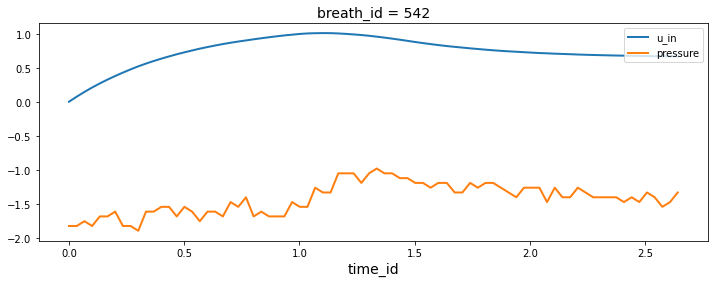

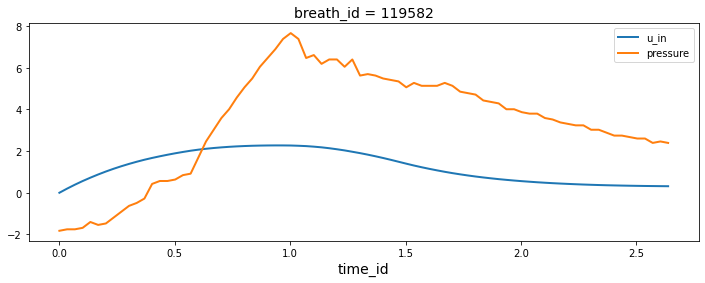

In [104]:
breath_542 = train_data.query('breath_id == 542').reset_index(drop = True)
fig, ax = plt.subplots(1, 1, figsize=(12, 4))
ax.plot(breath_542["time_step"],breath_542["u_in"], lw=2, label='u_in')
ax.plot(breath_542["time_step"],breath_542["pressure"], lw=2, label='pressure')
#ax.set(xlim=(0,1))
ax.legend(loc="upper right")
ax.set_xlabel("time_id", fontsize=14)
ax.set_title("breath_id = 542", fontsize=14)
plt.show();

breath_119582 = train_data.query('breath_id == 119582').reset_index(drop = True)
fig, ax = plt.subplots(1, 1, figsize=(12, 4))
ax.plot(breath_119582["time_step"],breath_119582["u_in"], lw=2, label='u_in')
ax.plot(breath_119582["time_step"],breath_119582["pressure"], lw=2, label='pressure')
#ax.set(xlim=(0,1))
ax.legend(loc="upper right")
ax.set_xlabel("time_id", fontsize=14)
ax.set_title("breath_id = 119582", fontsize=14)
plt.show();

all of the instances of negative pressure occur only in the R=50 (high restriction) with C=10 (thick latex) systems.

We shall add a new feature, which is the cumulative sum of the u_in feature:

In [105]:
train_data['u_in_cumsum'] = (train_data['u_in']).groupby(train_data['breath_id']).cumsum()
test_data['u_in_cumsum']  = (test_data['u_in']).groupby(test_data['breath_id']).cumsum()

The thinking behind this feature is that it is reasonable to assume the pressure in the lungs is approximately proportional to how much air has actually been pumped into them. It goes almost without saying that this feature is not useful when breathing out, but given that the expiratory phase is not scored in this competition this should not be too much of a problem.

### Shifting u_in

Let us take a look at the first second of breath_id=928, which is an excellent example of an oscillatory experiment

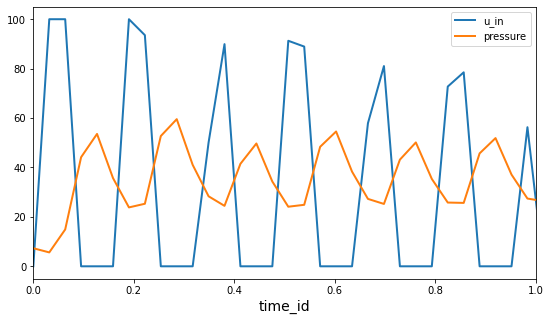

In [106]:
breath_928 = train_data.query('breath_id == 928').reset_index(drop = True)
fig, ax = plt.subplots(1, 1, figsize=(9, 5))
ax.plot(breath_928["time_step"],breath_928["u_in"], lw=2, label='u_in')
ax.plot(breath_928["time_step"],breath_928["pressure"], lw=2, label='pressure')
ax.set(xlim=(0,1))
ax.legend(loc="upper right")
ax.set_xlabel("time_id", fontsize=14)
plt.show();

It can be observed that there is a lag between u_in and the resulting pressure of around 0.1 seconds. I am sure it is with this in mind that Chun Fu wrote his excellent notebook "Add lag u_in as new feat", which introduces a new shifted u_in feature. Here we shall use a shift of 2 rather than his original shift of 1, which is now more in line with the delay seen:

In [107]:
train_data['u_in_shifted'] = train_data.groupby('breath_id')['u_in'].shift(2).fillna(method="backfill")
test_data['u_in_shifted']  = test_data.groupby('breath_id')['u_in'].shift(2).fillna(method="backfill")

### Descriptive statistics of u_in

inspired by the work of Chun Fu, this time in his notebook "Add last u_in as new feat" it is found, at least with gradient boosting type models, that providing the estimator with some descriptive statistics regarding u_in for the cycle in question seems to help in improving the model. Here are a number of examples, some of which may (or may not) be useful:

In [109]:
for df in (train_data, test_data):
    df['u_in_first']  = df.groupby('breath_id')['u_in'].transform('first')
    df['u_in_mean']   = df.groupby('breath_id')['u_in'].transform('mean')
    df['u_in_median'] = df.groupby('breath_id')['u_in'].transform('median')
    df['u_in_last']   = df.groupby('breath_id')['u_in'].transform('last')
    df['u_in_min']    = df.groupby('breath_id')['u_in'].transform('min')
    df['u_in_max']    = df.groupby('breath_id')['u_in'].transform('max')

In [ ]:
X_train = train_data.drop(['pressure'], axis=1)
y_train = train_data['pressure']
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble     import HistGradientBoostingRegressor
regressor  =  HistGradientBoostingRegressor(max_iter=2500,
     loss="least_absolute_deviation",early_stopping=False)
regressor.fit(X_train, y_train)
sample["pressure"] = regressor.predict(test_data)
sample.to_csv('submission.csv',index=False)

### Add lag u_in as a New Feature

https://www.kaggle.com/patrick0302/add-lag-u-in-as-new-feat/notebook

,id,breath_id,R,C,time_step,u_in,u_out,pressure,u_in_cumsum,u_in_shifted,u_in_first,u_in_mean,u_in_median,u_in_last,u_in_min,u_in_max
0,1,1,20,50,0.000000,0.083334,0,5.837492,0.083334,0.083334,0.083334,10.146007,4.922568,4.987079,0.0,28.313036
1,2,1,20,50,0.033652,18.383041,0,5.907794,18.466375,0.083334,0.083334,10.146007,4.922568,4.987079,0.0,28.313036
2,3,1,20,50,0.067514,22.509278,0,7.876254,40.975653,0.083334,0.083334,10.146007,4.922568,4.987079,0.0,28.313036
3,4,1,20,50,0.101542,22.808822,0,11.742872,63.784476,18.383041,0.083334,10.146007,4.922568,4.987079,0.0,28.313036
4,5,1,20,50,0.135756,25.355850,0,12.234987,89.140326,22.509278,0.083334,10.146007,4.922568,4.987079,0.0,28.313036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6035995,6035996,125749,50,10,2.504603,1.489714,1,3.869032,387.109297,1.353205,6.030572,4.911402,1.694180,1.482739,0.0,25.504196
6035996,6035997,125749,50,10,2.537961,1.488497,1,3.869032,388.597794,1.420711,6.030572,4.911402,1.694180,1.482739,0.0,25.504196
6035997,6035998,125749,50,10,2.571408,1.558978,1,3.798729,390.156772,1.489714,6.030572,4.911402,1.694180,1.482739,0.0,25.504196
6035998,6035999,125749,50,10,2.604744,1.272663,1,4.079938,391.429435,1.488497,6.030572,4.911402,1.694180,1.482739,0.0,25.504196


In [112]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [116]:
# Add last_value_u_in

idxmax_time_step = train_data.groupby('breath_id')['time_step'].idxmax()
last_value_u_in = train_data.loc[idxmax_time_step, ['breath_id','u_in']]
last_value_u_in.columns = ['breath_id','last_value_u_in']

train_data = train_data.merge(last_value_u_in, on='breath_id')

idxmax_time_step = test_data.groupby('breath_id')['time_step'].idxmax()
last_value_u_in = test_data.loc[idxmax_time_step, ['breath_id','u_in']]
last_value_u_in.columns = ['breath_id','last_value_u_in']

test_data = test_data.merge(last_value_u_in, on='breath_id')

In [117]:
# Add u_in_lag

train_df['u_in_lag'] = train_df['u_in'].shift(1)
train_df = train_df.fillna(0)

test_df['u_in_lag'] = test_df['u_in'].shift(1)
test_df = test_df.fillna(0)

In [118]:
train_data

,id,breath_id,R,C,time_step,u_in,u_out,pressure,last_value_u_in
0,1,1,20,50,0.000000,0.083334,0,5.837492,4.987079
1,2,1,20,50,0.033652,18.383041,0,5.907794,4.987079
2,3,1,20,50,0.067514,22.509278,0,7.876254,4.987079
3,4,1,20,50,0.101542,22.808822,0,11.742872,4.987079
4,5,1,20,50,0.135756,25.355850,0,12.234987,4.987079
...,...,...,...,...,...,...,...,...,...
6035995,6035996,125749,50,10,2.504603,1.489714,1,3.869032,1.482739
6035996,6035997,125749,50,10,2.537961,1.488497,1,3.869032,1.482739
6035997,6035998,125749,50,10,2.571408,1.558978,1,3.798729,1.482739
6035998,6035999,125749,50,10,2.604744,1.272663,1,4.079938,1.482739


https://www.kaggle.com/theoviel/deep-learning-starter-simple-lstm

In [125]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

,id,breath_id,R,C,time_step,u_in,u_out,pressure
0,1,1,20,50,0.000000,0.083334,0,5.837492
1,2,1,20,50,0.033652,18.383041,0,5.907794
2,3,1,20,50,0.067514,22.509278,0,7.876254
3,4,1,20,50,0.101542,22.808822,0,11.742872
4,5,1,20,50,0.135756,25.355850,0,12.234987
...,...,...,...,...,...,...,...,...
6035995,6035996,125749,50,10,2.504603,1.489714,1,3.869032
6035996,6035997,125749,50,10,2.537961,1.488497,1,3.869032
6035997,6035998,125749,50,10,2.571408,1.558978,1,3.798729
6035998,6035999,125749,50,10,2.604744,1.272663,1,4.079938


In [128]:
df = df_train[df_train['breath_id'] < 5].reset_index(drop=True)
df.head()

,id,breath_id,R,C,time_step,u_in,u_out,pressure
0,1,1,20,50,0.000000,0.083334,0,5.837492
1,2,1,20,50,0.033652,18.383041,0,5.907794
2,3,1,20,50,0.067514,22.509278,0,7.876254
3,4,1,20,50,0.101542,22.808822,0,11.742872
4,5,1,20,50,0.135756,25.355850,0,12.234987


In [129]:
def plot_sample(sample_id, df):
    df_breath = df[df['breath_id'] == sample_id]
    r, c  = df_breath[['R', 'C']].values[0]

    cols = ['u_in', 'u_out', 'pressure'] if 'pressure' in df.columns else ['u_in', 'u_out']
    
    plt.figure(figsize=(12, 4))
    for col in ['u_in', 'u_out', 'pressure']:
        plt.plot(df_breath['time_step'], df_breath[col], label=col)
        
    plt.legend()
    plt.title(f'Sample {sample_id} - R={r}, C={c}')

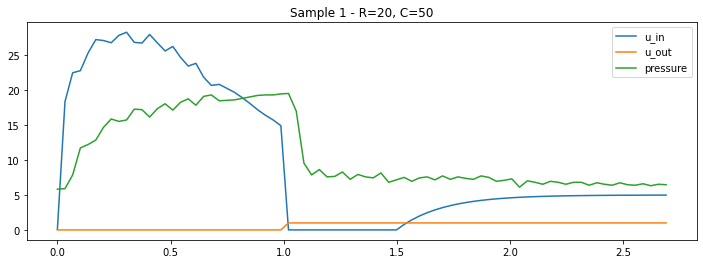

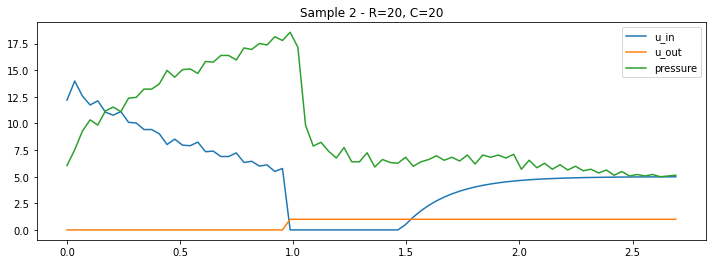

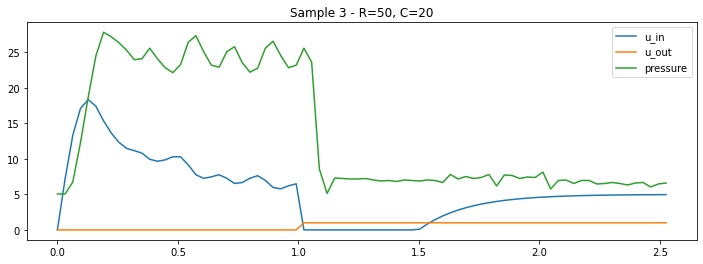

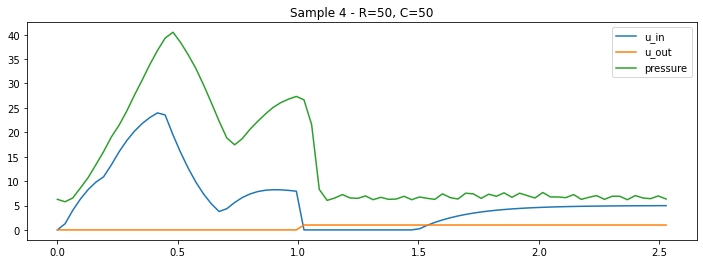

In [130]:
for i in df['breath_id'].unique():
    plot_sample(i, df_train)

https://www.kaggle.com/manabendrarout/single-bi-lstm-model-pressure-predict-gpu-infer

In [16]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

In [17]:
all_pressure = np.sort(train_df.pressure.unique())
PRESSURE_MIN = all_pressure[0].item()
PRESSURE_MAX = all_pressure[-1].item()
PRESSURE_STEP = ( all_pressure[1] - all_pressure[0] ).item()

In [18]:
def add_features(df):
    df['area'] = df['time_step'] * df['u_in']
    df['area'] = df.groupby('breath_id')['area'].cumsum()
    df['u_in_cumsum'] = (df['u_in']).groupby(df['breath_id']).cumsum()
    df['u_in_lag1'] = df.groupby('breath_id')['u_in'].shift(1)
    df['u_out_lag1'] = df.groupby('breath_id')['u_out'].shift(1)
    df['u_in_lag_back1'] = df.groupby('breath_id')['u_in'].shift(-1)
    df['u_out_lag_back1'] = df.groupby('breath_id')['u_out'].shift(-1)
    df['u_in_lag2'] = df.groupby('breath_id')['u_in'].shift(2)
    df['u_out_lag2'] = df.groupby('breath_id')['u_out'].shift(2)
    df['u_in_lag_back2'] = df.groupby('breath_id')['u_in'].shift(-2)
    df['u_out_lag_back2'] = df.groupby('breath_id')['u_out'].shift(-2)
    df['u_in_lag3'] = df.groupby('breath_id')['u_in'].shift(3)
    df['u_out_lag3'] = df.groupby('breath_id')['u_out'].shift(3)
    df['u_in_lag_back3'] = df.groupby('breath_id')['u_in'].shift(-3)
    df['u_out_lag_back3'] = df.groupby('breath_id')['u_out'].shift(-3)
    df['u_in_lag4'] = df.groupby('breath_id')['u_in'].shift(4)
    df['u_out_lag4'] = df.groupby('breath_id')['u_out'].shift(4)
    df['u_in_lag_back4'] = df.groupby('breath_id')['u_in'].shift(-4)
    df['u_out_lag_back4'] = df.groupby('breath_id')['u_out'].shift(-4)
    df = df.fillna(0)
    df['breath_id__u_in__max'] = df.groupby(['breath_id'])['u_in'].transform('max')
    df['breath_id__u_out__max'] = df.groupby(['breath_id'])['u_out'].transform('max')
    df['u_in_diff1'] = df['u_in'] - df['u_in_lag1']
    df['u_out_diff1'] = df['u_out'] - df['u_out_lag1']
    df['u_in_diff2'] = df['u_in'] - df['u_in_lag2']
    df['u_out_diff2'] = df['u_out'] - df['u_out_lag2']
    df['breath_id__u_in__diffmax'] = df.groupby(['breath_id'])['u_in'].transform('max') - df['u_in']
    df['breath_id__u_in__diffmean'] = df.groupby(['breath_id'])['u_in'].transform('mean') - df['u_in']
    df['breath_id__u_in__diffmax'] = df.groupby(['breath_id'])['u_in'].transform('max') - df['u_in']
    df['breath_id__u_in__diffmean'] = df.groupby(['breath_id'])['u_in'].transform('mean') - df['u_in']
    df['u_in_diff3'] = df['u_in'] - df['u_in_lag3']
    df['u_out_diff3'] = df['u_out'] - df['u_out_lag3']
    df['u_in_diff4'] = df['u_in'] - df['u_in_lag4']
    df['u_out_diff4'] = df['u_out'] - df['u_out_lag4']
    df['cross']= df['u_in']*df['u_out']
    df['cross2']= df['time_step']*df['u_out']
    df['R'] = df['R'].astype(str)
    df['C'] = df['C'].astype(str)
    df['R__C'] = df["R"].astype(str) + '__' + df["C"].astype(str)
    df = pd.get_dummies(df)
    return df

In [19]:
train_df = add_features(train_df)
test_df = add_features(test_df)

display(train_df.head())
print(train_df.shape)
print(test_df.shape)

,id,breath_id,time_step,u_in,u_out,area,u_in_cumsum,u_in_lag1,u_out_lag1,u_in_lag_back1,u_out_lag_back1,u_in_lag2,u_out_lag2,u_in_lag_back2,u_out_lag_back2,u_in_lag3,u_out_lag3,u_in_lag_back3,u_out_lag_back3,u_in_lag4,u_out_lag4,u_in_lag_back4,u_out_lag_back4,breath_id__u_in__max,breath_id__u_out__max,u_in_diff1,u_out_diff1,u_in_diff2,u_out_diff2,breath_id__u_in__diffmax,breath_id__u_in__diffmean,u_in_diff3,u_out_diff3,u_in_diff4,u_out_diff4,cross,cross2,R_20,R_5,R_50,C_10,C_20,C_50,R__C_20__10,R__C_20__20,R__C_20__50,R__C_50__10,R__C_50__20,R__C_50__50,R__C_5__10,R__C_5__20,R__C_5__50
0,1,0,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.0,7.515046,0.0,0.000000,0.0,14.651675,0.0,0.000000,0.0,21.230610,0.0,0.0,0.0,26.320956,0.0,37.542219,1,0.000000,0.0,0.000000,0.0,37.542219,9.327338,0.000000,0.0,0.000000,0.0,0.0,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
1,2,0,0.031904,7.515046,0,0.239758,7.515046,0.000000,0.0,14.651675,0.0,0.000000,0.0,21.230610,0.0,0.000000,0.0,26.320956,0.0,0.0,0.0,30.486938,0.0,37.542219,1,7.515046,0.0,7.515046,0.0,30.027173,1.812292,7.515046,0.0,7.515046,0.0,0.0,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
2,3,0,0.063827,14.651675,0,1.174935,22.166721,7.515046,0.0,21.230610,0.0,0.000000,0.0,26.320956,0.0,0.000000,0.0,30.486938,0.0,0.0,0.0,33.545950,0.0,37.542219,1,7.136630,0.0,14.651675,0.0,22.890543,-5.324338,14.651675,0.0,14.651675,0.0,0.0,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
3,4,0,0.095751,21.230610,0,3.207788,43.397331,14.651675,0.0,26.320956,0.0,7.515046,0.0,30.486938,0.0,0.000000,0.0,33.545950,0.0,0.0,0.0,35.717600,0.0,37.542219,1,6.578935,0.0,13.715564,0.0,16.311609,-11.903272,21.230610,0.0,21.230610,0.0,0.0,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
4,5,0,0.127644,26.320956,0,6.567489,69.718287,21.230610,0.0,30.486938,0.0,14.651675,0.0,33.545950,0.0,7.515046,0.0,35.717600,0.0,0.0,0.0,36.971061,0.0,37.542219,1,5.090346,0.0,11.669281,0.0,11.221263,-16.993619,18.805911,0.0,26.320956,0.0,0.0,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0


(4024000, 52)


In [20]:
# General
from IPython.display import display
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import os
import glob
import random
import gc
gc.enable()
pd.set_option('display.max_columns', None)

# Utils
from sklearn import preprocessing
# Deep Learning
import tensorflow as tf
from tensorflow import keras
# Metrics
from sklearn.metrics import mean_absolute_error

# Random Seed Initialize
RANDOM_SEED = 42

def seed_everything(seed=RANDOM_SEED):
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    
seed_everything()

In [21]:
train_df.drop(['id', 'pressure', 'breath_id'], axis=1, inplace=True)
test_df = test_df.drop(['id', 'breath_id'], axis=1)

scaler = preprocessing.RobustScaler()
train_df = scaler.fit_transform(train_df)
test_df = scaler.transform(test_df)

del train_df
gc.collect()

X_test = test_df.reshape(-1, 80, test_df.shape[-1])

https://www.kaggle.com/bryanb/ventilator-pressure-prediction-eda

In [25]:
import warnings
warnings.filterwarnings('ignore')

from tqdm import tqdm
import pandas as pd
import numpy as np
import itertools
import pprint
import random
import os

from plotly.offline import iplot, init_notebook_mode
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import tools
import plotly.io as pio

!pip install tslearn
from tslearn.clustering import TimeSeriesKMeans
from sklearn.model_selection import KFold

pp = pprint.PrettyPrinter(indent=4)
pio.templates.default = "plotly_white"

In [22]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [23]:
breath_ids = train.breath_id.sample(n = 5000//80, replace = False)
train_EDA = train.loc[train.breath_id.isin(breath_ids), :].reset_index(drop = True)

In [26]:
fig = px.histogram(
    train_EDA, 
    x="pressure",
    marginal="box",
    color="u_out",
    hover_data=train_EDA.columns,
    nbins = 50
)

fig.update_layout(
    title="Pressure distribution"
)

fig.show()

In [27]:

fig = px.histogram(
    train_EDA, 
    x="u_in",
    marginal="box",
    color="u_out",
    hover_data=train_EDA.columns,
    nbins = 50
)

fig.update_layout(
    title="u_in distribution"
)

fig.show()

In [28]:
corr = train_EDA.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

fig = px.imshow(corr.mask(mask))
fig.show()

del corr, mask

https://www.kaggle.com/t88take/searching-similar-u-in-using-cosine-similarity

In [30]:
from sklearn.metrics.pairwise import cosine_similarity

In [31]:
train = pd.read_csv('train.csv')
train['RC'] = train['R'].astype(str) + '_' + train['C'].astype(str)

In [32]:
# breath_id × u_in(0 - 79)
train['num'] = train.groupby(['breath_id', 'RC']).cumcount()
u_in_table = pd.pivot_table(train, index=['breath_id', 'RC'], columns='num', values='u_in')
u_in_table = u_in_table.reset_index()

In [33]:
def search_similar_id(target_id, th):
    """
    Find a breath_id with a similar u_in pattern.

    Parameters
    ----------
    target_id : int
        Target breath_id
    th : float
        Cosine similarity threshold

    Returns
    -------
    similar_id : list
        List of ids with similar patterns
    """
    
    if target_id in u_in_table['breath_id'].tolist():
        target_rc = u_in_table[u_in_table['breath_id']==target_id]['RC'].values[0]
        target_vec = u_in_table[u_in_table['breath_id']==target_id].to_numpy()[:,2:]

        refer_table = u_in_table[(u_in_table['RC']==target_rc) & (u_in_table['breath_id']!=target_id)].reset_index(drop=True)
        refer_vec = refer_table.to_numpy()[:,2:]
        breaths = refer_table['breath_id'].unique().tolist()
        breath_map = {i:b for i,b in enumerate(breaths)}

        cs = cosine_similarity(target_vec, refer_vec)[0]
        similar_idx = list(np.where(cs>th)[0])
        similar_id = [breath_map[i] for i in similar_idx]
    
    else:
        similar_id = []
        
    return similar_id

In [35]:
def viz_similar_id(target_id, th=0.9):
    """
    Visualize and compare u_in and pressure of breath_id with similar patterns.

    Parameters
    ----------
    target_id : int
        Target breath_id
    th : float
        Cosine similarity threshold
    """
    rc = u_in_table[u_in_table['breath_id']==target_id]['RC'].values[0]
    similar_ids = search_similar_id(target_id, th)
    viz_id = [target_id] + similar_ids
    
    fig, axes = plt.subplots(figsize=(16, 9), nrows=2,sharex=True)
    for id_ in viz_id:
        tmp = train[train['breath_id']==id_].copy()
        axes[0].plot(tmp['time_step'], tmp['u_in'], label='breath_id : ' + str(id_))
        axes[1].plot(tmp['time_step'], tmp['pressure'], label='breath_id : ' + str(id_))
        axes[0].legend(loc='upper right')
        axes[0].grid(color='g', linestyle=':', linewidth=0.3)
        axes[0].set_title('u_in')
        axes[1].legend(loc='upper right')
        axes[1].grid(color='g', linestyle=':', linewidth=0.3)
        axes[1].set_title('pressure')
        fig.suptitle(f'target_id : {target_id}  (RC={rc})')

In [ ]:
viz_similar_id(target_id=1)